In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
259,2021-09-23,2.925
260,2021-09-24,3.252
261,2021-09-25,0.091
262,2021-09-26,0.000


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-10-14    2.925
2021-10-15    3.252
2021-10-16    0.091
2021-10-17    0.000
2021-10-18    2.347
Name: Vacunas, Length: 264, dtype: float64

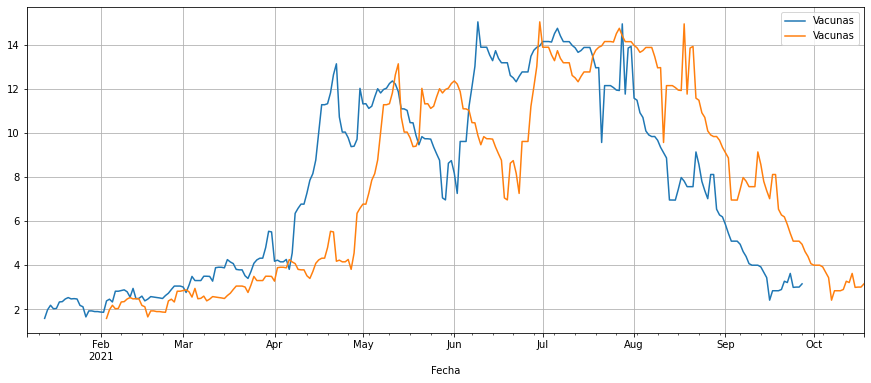

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

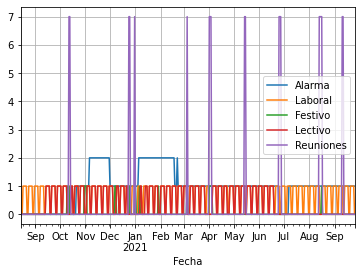

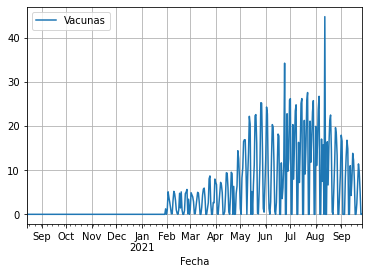

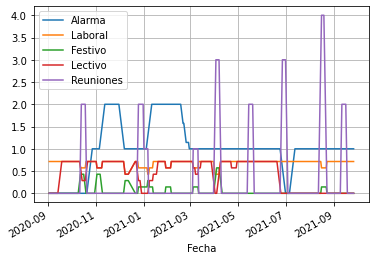

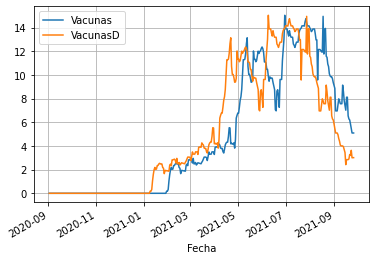

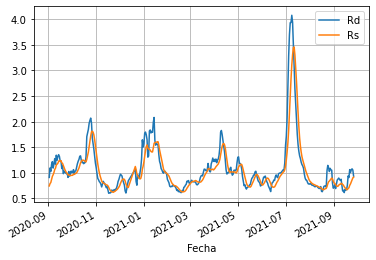

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
puntos.loc['2020/10/31':'2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']

puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1

puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
#puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7

puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-22,3,83,2454,1969.0,3.38,48.14,67,18,8,9,...,41.688456,87.791843,89.002929,81.272471,86.188026,89.104483,88.644861,89.236083,91.211673,89.000643
2021-09-23,4,87,2279,1717.0,3.82,53.94,61,19,8,6,...,41.395287,87.785248,88.992634,81.266013,86.183792,89.098999,88.641951,89.229296,91.205755,88.991336
2021-09-24,5,85,2581,1755.0,3.29,41.65,59,13,4,17,...,41.234811,87.778805,88.985589,81.262784,86.171795,89.094512,88.635645,89.229296,91.197618,88.980034
2021-09-25,6,52,1322,911.0,3.93,26.00,45,12,4,4,...,41.234811,87.774864,88.979087,81.259554,86.168973,89.091520,88.632250,89.228165,91.195399,88.971391
2021-09-26,7,41,1149,668.0,3.57,22.14,29,11,2,3,...,41.234718,87.771756,88.973126,81.257940,86.166856,89.090025,88.629825,89.224772,91.192440,88.967402


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-09-27,2021-09-28,2021-09-29
Día de la semana,1.000000,2.000000,3.000000
Casos,84.000000,82.000000,NaN
test coresp,2484.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,1881.000000,NaN,NaN
Tasa de positividad (%),3.380000,NaN,NaN
Asintomáticos,52.920000,48.380000,NaN
Zaragoza,51.000000,63.000000,NaN
1 a 14 años,14.000000,NaN,NaN
15 a 24 años,5.000000,NaN,NaN
25 a 34 años,10.000000,NaN,NaN


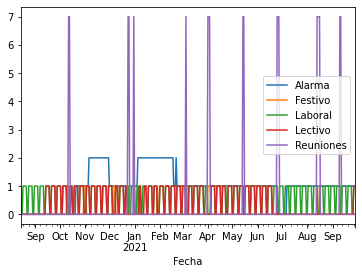

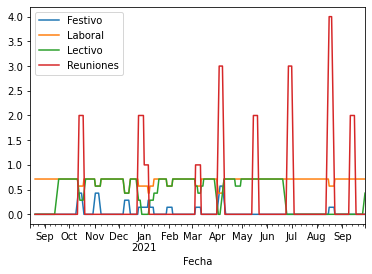

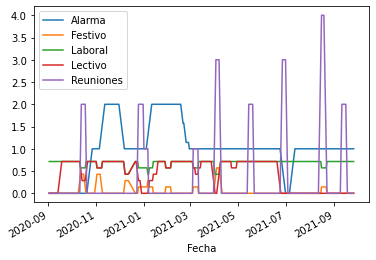

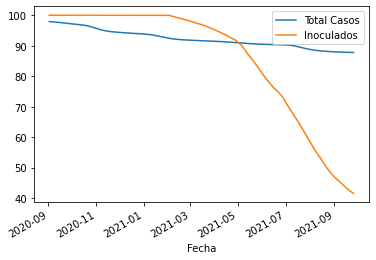

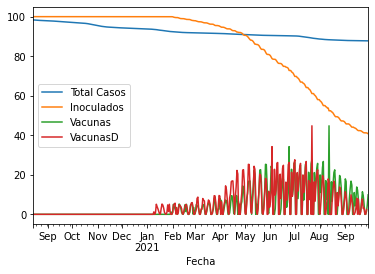

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

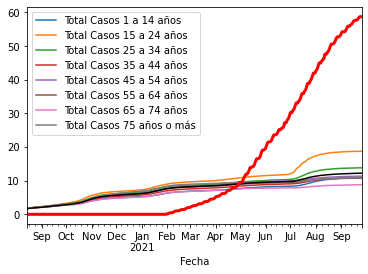

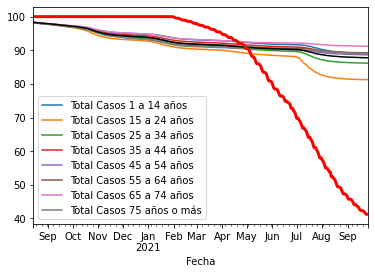

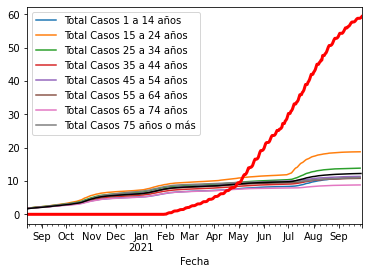

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-09-25,87.774864,41.234811
2021-09-26,87.771756,41.234718
2021-09-27,87.765389,41.189920


,Total Casos,Inoculados
Fecha,,
2021-09-27,87.765389,41.189920
2021-09-28,87.759173,41.040860
2021-09-29,NaN,40.735594


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-27,1,84.0,2484.0,1881.0,3.38,52.92,51.0,14.0,5.0,10.0,...,41.189920,87.765389,88.96554,81.253903,86.159799,89.086535,88.622549,89.22251,91.19022,88.950782
2021-09-28,2,82.0,NaN,NaN,NaN,48.38,63.0,NaN,NaN,NaN,...,41.040860,87.759173,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-29,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,40.735594,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-25,6,52.0,1322.0,911.0,3.93,26.00,45.0,12.0,4.0,4.0,...,91.195399,88.971391,17201.0,21108.0,17191.0,18470.0,19932.0,16041.0,9604.0,14032.0
2021-09-26,7,41.0,1149.0,668.0,3.57,22.14,29.0,11.0,2.0,3.0,...,91.192440,88.967402,17212.0,21110.0,17194.0,18473.0,19937.0,16047.0,9608.0,14038.0
2021-09-27,1,84.0,2484.0,1881.0,3.38,52.92,51.0,14.0,5.0,10.0,...,91.190220,88.950782,17226.0,21115.0,17204.0,18480.0,19952.0,16051.0,9611.0,14063.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    #'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.844535,0.929110,0.917618,0.821613,0.963622,0.771686,0.917576,0.725910,0.785145,0.835688,...,1,1,1.000108,1.000198,1.000118,1.000091,1.000089,1.000083,1.000050,1.000061
2,1.202598,1.209490,0.990762,1.171088,0.971866,1.208585,1.001260,1.267209,1.175261,1.206806,...,1,1,1.000059,1.000124,1.000059,1.000038,1.000044,1.000034,1.000033,1.000040
3,1.185210,1.214577,0.979982,1.171705,0.988832,1.208030,1.020348,1.202817,1.241327,1.180891,...,1,1,1.000008,1.000013,1.000004,0.999990,0.999994,0.999989,1.000008,1.000020
4,1.204498,1.129111,1.072273,1.227323,1.021376,1.212096,1.012267,1.213362,1.257507,1.212702,...,1,1,0.999956,0.999897,0.999939,0.999957,0.999952,0.999958,0.999972,0.999965
5,1.134529,1.117790,1.023941,1.085562,0.956806,1.141235,1.014290,1.178853,1.176606,1.156958,...,1,1,0.999901,0.999795,0.999882,0.999914,0.999912,0.999923,0.999943,0.999937
6,0.850194,0.822570,1.043727,0.938191,1.097613,0.891587,1.047794,0.926299,0.821246,0.841124,...,1,1,0.999921,0.999868,0.999926,0.999952,0.999947,0.999956,0.999960,0.999951
7,0.551381,0.564980,0.963226,0.556355,0.999045,0.543413,0.988105,0.466986,0.513089,0.532783,...,1,1,1.000041,1.000086,1.000061,1.000049,1.000053,1.000048,1.000027,1.000019


Casos                        0.996135
test coresp                  0.998232
Tasa de positividad (%)      0.998790
Asintomáticos                0.995977
Asintomáticos (%)            0.999880
Zaragoza                     0.996662
Zaragoza (%)                 1.000234
1 a 14 años                  0.997348
15 a 24 años                 0.995740
25 a 34 años                 0.995279
35 a 44 años                 0.995639
45 a 54 años                 0.996373
55 a 64 años                 0.996281
65 a 74 años                 0.995260
75 años o más                0.991076
Camas Ocup                   0.998253
Camas libres                 0.999765
Camas (%)                    0.997520
UCI ocupadas                 0.998942
UCI libres con resp          0.999648
UCI (%)                      0.997947
Rs                           1.000000
Rd                           1.000000
Inoculados                   1.000000
Total Casos                  1.000000
Total Casos 1 a 14 años      0.999999
Total Casos 

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-09-22    0.875740
2021-09-23    0.948800
2021-09-24    0.975042
2021-09-25    0.958472
2021-09-26    0.911576
Name: Casos, Length: 409, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-09-27        NaN
2021-09-28    0.97619
2021-09-29        NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,0.978313,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,0.823529,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,0.921569,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,33.428571,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,31.714286,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,34.000000,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,33.857143,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,32.000000,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-22,84.571429,1931.857143,4.472857,48.507143,57.571429,58.857143,67.823586,15.714286,6.142857,9.428571,...,42.225758,87.812102,89.033352,81.286080,86.210405,89.120295,88.659481,89.251271,91.218437,89.037492
2021-09-23,84.714286,1986.714286,4.370000,48.964286,58.000000,59.000000,67.873229,17.142857,6.000000,9.428571,...,42.057203,87.805681,89.024063,81.281236,86.203752,89.115309,88.655185,89.246586,91.215478,89.025906
2021-09-24,83.714286,2069.142857,4.184286,48.342857,57.857143,57.714286,67.230189,16.428571,5.285714,9.857143,...,41.899648,87.799336,89.015160,81.276969,86.196796,89.110466,88.650681,89.242304,91.211885,89.014319


<AxesSubplot:xlabel='Fecha'>

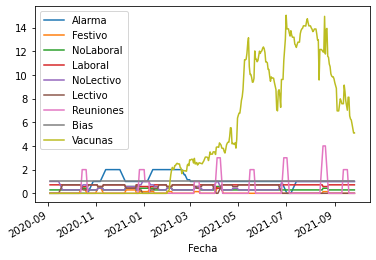

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 108 ms, sys: 11.3 ms, total: 120 ms
Wall time: 20 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000251,-0.000032,-0.010075,-0.000405,0.003113,-0.000191,-0.001819,-0.001191,0.000862,0.001005,...,1.021117,0.019382,0.053234,-2.477619,-2.270164,-2.354040,-2.393743,0.000772,-4.747782,0.002971
2020-09-04,0.000376,0.000023,-0.003637,-0.000433,0.001976,-0.000129,-0.000875,-0.001959,0.000029,0.000691,...,0.867650,0.013057,0.011644,-4.003707,-3.931827,-3.948981,-3.986552,0.002874,-7.935533,0.000432
2020-09-05,0.001020,-0.000020,-0.007859,-0.000612,0.003674,-0.000474,-0.000590,-0.000933,0.000314,-0.000151,...,0.630545,0.023315,0.041493,-1.288193,-1.149230,-1.199426,-1.237996,-0.000470,-2.437422,0.002450
2020-09-06,0.000037,-0.000035,-0.008699,-0.000290,0.002674,0.000424,-0.000329,-0.000592,0.000542,0.001023,...,0.530233,0.011551,0.056099,-1.222662,-1.110661,-1.150073,-1.183249,-0.001753,-2.333322,0.000566
2020-09-07,0.000262,-0.000008,-0.001564,-0.000036,0.000168,0.000417,0.001466,-0.000985,-0.000340,0.000077,...,0.251397,0.007099,0.040979,-1.413011,-1.342973,-1.361307,-1.394676,-0.001196,-2.755984,-0.002603
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-22,0.000114,-0.000044,-0.011027,-0.000996,0.003741,0.000549,-0.002107,0.001428,-0.000173,0.000018,...,-0.515762,0.033016,-0.020362,3.496169,3.459802,3.477745,3.478226,-0.005084,6.955971,0.003684
2021-09-23,0.000504,-0.000006,-0.005587,-0.001047,0.004303,0.000142,-0.000508,0.000615,-0.000536,-0.000194,...,-0.611502,0.030931,-0.016466,3.963739,3.920703,3.942316,3.942126,-0.005138,7.884442,0.002466
2021-09-24,0.000789,0.000014,-0.002506,-0.001185,0.004838,-0.000023,0.000395,0.000733,-0.000936,-0.000292,...,-0.697117,0.029081,-0.018312,3.821410,3.749981,3.787785,3.783606,-0.004814,7.571391,0.001197



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


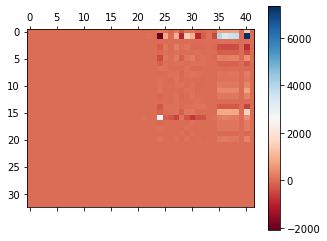

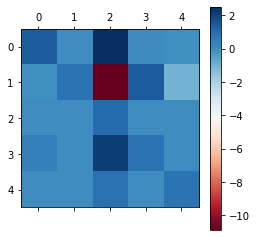

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(42, 381) = (42, 42)·(42, 42)·(42, 381)
CPU times: user 16.8 ms, sys: 10.2 ms, total: 27 ms
Wall time: 4.18 ms


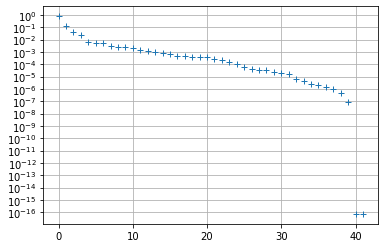

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{32}$,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$
Casos,-0.119666,0.241224,-0.191012,-0.670135,0.060561,0.051003,-0.026869,0.413485,0.122225,-0.048558,...,1.448388e-03,0.001972,0.001290,0.000123,0.000135,0.000040,0.000099,2.668436e-05,3.029576e-18,8.065048e-18
test coresp,-0.889511,0.332319,-0.066988,0.302823,0.010086,-0.018728,-0.010692,0.006167,-0.018308,-0.028777,...,-8.355975e-07,-0.000084,-0.000005,0.000004,-0.000004,-0.000028,0.000011,-3.394526e-06,9.833511e-19,7.608801e-19
Tasa de positividad (%),-0.003517,0.000214,-0.002840,-0.023342,-0.009444,-0.001642,0.016099,0.028229,-0.021355,0.022280,...,-2.457474e-03,-0.001434,-0.000270,-0.005821,-0.002596,-0.008105,0.001027,-4.660736e-04,2.091935e-16,1.537913e-16
Asintomáticos,-0.060414,0.131290,-0.115702,-0.340452,0.004270,-0.049703,-0.416269,-0.737746,0.236932,0.006388,...,-7.976221e-04,-0.000045,-0.000589,-0.000169,-0.000303,-0.000086,-0.000057,-4.769751e-06,1.205595e-17,1.087251e-17
Asintomáticos (%),-0.014237,-0.022792,0.002696,0.002136,0.010824,-0.014623,-0.076448,-0.132079,0.176570,-0.019092,...,-8.423307e-04,0.000621,0.000488,0.000132,0.001330,-0.000377,0.000137,7.386751e-05,-3.454204e-17,1.330311e-17
Zaragoza,-0.083758,0.152336,-0.131041,-0.403671,0.053586,0.075383,0.351540,-0.127291,-0.345596,0.232252,...,2.879895e-04,0.000101,-0.000506,0.000054,0.000357,0.000025,0.000024,1.257564e-05,-5.676646e-18,-1.170166e-17
Zaragoza (%),-0.020686,-0.041714,0.005197,0.035201,0.070448,0.107203,0.202740,-0.118433,0.157580,0.253731,...,2.503618e-03,0.002445,-0.001185,-0.000758,-0.000101,0.000090,0.000543,-2.156218e-05,3.433195e-17,1.315615e-17
1 a 14 años,-0.014433,0.022571,-0.030481,-0.035629,0.062189,-0.287639,-0.225659,0.138696,-0.045273,0.562074,...,-1.781627e-03,0.002013,-0.000220,-0.000796,-0.000651,0.000329,-0.000461,2.156271e-05,-7.396586e-18,-2.703150e-17
15 a 24 años,-0.018415,0.034992,-0.200279,-0.103706,-0.814748,0.054228,0.229336,0.047218,0.116553,-0.149720,...,-1.695736e-03,-0.001727,-0.001098,-0.000268,0.000022,0.000075,-0.000342,-9.819337e-06,-1.664316e-17,-4.160181e-18
25 a 34 años,-0.014780,0.030830,-0.070498,-0.081845,-0.135074,-0.026211,-0.018598,-0.078204,-0.006664,0.152428,...,1.594373e-03,-0.000249,-0.001500,-0.001098,0.000115,0.000433,-0.000169,-5.013179e-05,-2.059985e-17,-1.217872e-17


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 2.03 ms, sys: 178 µs, total: 2.21 ms
Wall time: 2.11 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 70.8 ms, sys: 2.39 ms, total: 73.1 ms
Wall time: 11.2 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.240950,4.470787e-04,2.205055,0.111875,-0.207236,-0.351268,0.290181,-1.218463,0.258137,-1.200787e-01,...,-0.749876,-3.542871,-62.440763,24.571192,-25.053325,0.123466,-0.605600,1.177354,-0.482133,0.290568
test coresp,-2.062568,8.648690e-01,-0.652714,2.322639,-2.765446,0.334840,-0.313367,-1.711216,2.122532,1.849885e+00,...,-43.545189,-3.142616,-420.434843,287.947370,-289.788715,-48.305561,46.464216,3.560058,-1.841345,-2.256256
Tasa de positividad (%),0.004556,4.313991e-04,0.994889,-0.004767,-0.018214,-0.007586,-0.005857,-0.016670,0.005610,6.806895e-03,...,0.047075,-0.406558,0.422411,-0.913028,0.918964,0.228329,-0.222393,0.019991,0.005937,0.020211
Asintomáticos,0.148245,-3.704041e-03,1.684464,0.896515,-0.002961,-0.134683,0.438830,-0.453051,0.318227,-1.747118e-01,...,-2.565043,-2.013136,-29.544462,9.396818,-9.518702,-0.601262,0.479378,-0.211074,-0.121884,-0.564453
Asintomáticos (%),0.004047,1.638835e-03,0.478104,0.005678,0.824639,0.002070,0.106538,-0.010313,0.016274,-6.136156e-02,...,-0.963323,0.101151,-0.819417,0.857563,-0.826138,0.372919,-0.341494,-0.088707,0.031425,-0.245863
Zaragoza,0.327181,1.458938e-03,1.031317,0.070966,0.162478,0.540939,0.366445,-0.791844,0.169165,-1.554407e-01,...,3.331126,-2.663547,-29.987006,4.339293,-4.714279,2.363122,-2.738109,0.539167,-0.374987,0.051430
Zaragoza (%),0.004727,-2.699035e-04,-0.228739,-0.001480,0.049931,-0.000848,0.906819,0.002528,-0.009764,8.411923e-03,...,0.478265,-0.101599,3.782271,-3.423318,3.446575,0.661176,-0.637919,-0.154293,0.023258,-0.104607
1 a 14 años,0.017540,6.965135e-04,0.544111,0.048131,-0.023140,-0.057572,0.124555,0.758794,0.029450,4.311638e-02,...,0.056827,0.235303,-5.815558,1.150440,-1.191683,0.155416,-0.196659,0.124347,-0.041243,-0.024504
15 a 24 años,0.062915,4.502823e-03,0.987907,0.049707,-0.380679,-0.069886,0.001348,-0.307750,0.901089,1.358636e-02,...,-7.702978,-7.343914,-16.231134,9.469529,-9.213643,-1.656237,1.912123,0.830628,0.255886,-0.054929
25 a 34 años,0.028519,4.303391e-04,0.455393,0.006079,0.035750,-0.036040,0.064378,-0.149570,0.072621,8.554192e-01,...,-0.076006,-0.148273,-6.696539,4.495926,-4.560827,-0.504926,0.440024,-0.024286,-0.064902,0.041677


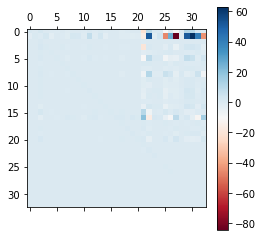

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.240950,4.470787e-04,2.205055,0.111875,-0.207236,-0.351268,0.290181,-1.218463,0.258137,-1.200787e-01,...,0.959123,1.268563,-10.497553,-1.737192,-11.087766,-0.434128,10.751790,10.247665,2.006195,-0.749876
test coresp,-2.062568,8.648690e-01,-0.652714,2.322639,-2.765446,0.334840,-0.313367,-1.711216,2.122532,1.849885e+00,...,-1.682225,4.318837,-45.990688,25.389610,-84.275117,-1.159117,51.066725,63.153026,40.933645,-43.545189
Tasa de positividad (%),0.004556,4.313991e-04,0.994889,-0.004767,-0.018214,-0.007586,-0.005857,-0.016670,0.005610,6.806895e-03,...,0.014891,-0.016496,0.168800,-0.091661,0.137268,0.035140,-0.103880,-0.139788,-0.068104,0.047075
Asintomáticos,0.148245,-3.704041e-03,1.684464,0.896515,-0.002961,-0.134683,0.438830,-0.453051,0.318227,-1.747118e-01,...,0.023218,0.225356,-2.048552,1.089548,-4.979455,0.160518,2.942036,3.323378,1.744719,-2.565043
Asintomáticos (%),0.004047,1.638835e-03,0.478104,0.005678,0.824639,0.002070,0.106538,-0.010313,0.016274,-6.136156e-02,...,-0.227901,-0.114693,0.843397,1.023362,-0.110252,0.083392,-0.618669,-0.350934,0.395258,-0.963323
Zaragoza,0.327181,1.458938e-03,1.031317,0.070966,0.162478,0.540939,0.366445,-0.791844,0.169165,-1.554407e-01,...,1.096600,1.057963,-8.160150,-4.168440,-4.714464,-0.538610,7.540400,5.967077,-1.295952,3.331126
Zaragoza (%),0.004727,-2.699035e-04,-0.228739,-0.001480,0.049931,-0.000848,0.906819,0.002528,-0.009764,8.411923e-03,...,0.081785,-0.039199,0.545178,-0.789509,0.759434,0.131238,-0.352388,-0.526596,-0.226613,0.478265
1 a 14 años,0.017540,6.965135e-04,0.544111,0.048131,-0.023140,-0.057572,0.124555,0.758794,0.029450,4.311638e-02,...,0.082927,0.125656,-0.789193,-0.508054,-0.919544,0.069098,0.944048,0.867947,0.167907,0.056827
15 a 24 años,0.062915,4.502823e-03,0.987907,0.049707,-0.380679,-0.069886,0.001348,-0.307750,0.901089,1.358636e-02,...,-0.773586,-0.911799,5.677793,4.389659,-3.132015,1.114477,-2.775134,-0.845722,5.091073,-7.702978
25 a 34 años,0.028519,4.303391e-04,0.455393,0.006079,0.035750,-0.036040,0.064378,-0.149570,0.072621,8.554192e-01,...,0.084995,0.159693,-1.529126,0.121712,-1.354507,-0.188044,1.285873,1.295575,0.173992,-0.076006


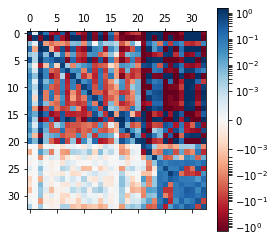

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(33, 381) = (33, 33)·(33, 33)·(33, 381)
CPU times: user 35.7 ms, sys: 28.2 ms, total: 63.9 ms
Wall time: 10.2 ms


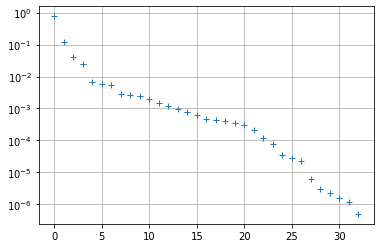

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.119611,0.241572,-0.190065,-0.670237,0.060895,0.051071,-0.030394,0.406185,-0.158763,0.025809,...,-0.047858,-0.009663,-0.008018,-0.009667,-0.005670,-0.003545,-0.001061,-0.000212,-0.000260,-0.000035
test coresp,-0.889522,0.331994,-0.067882,0.303053,0.010115,-0.019348,-0.009556,0.008961,0.010374,-0.030911,...,-0.004588,-0.000780,0.000798,-0.000040,-0.000087,0.000043,-0.000025,-0.000007,0.000014,-0.000031
Tasa de positividad (%),-0.003514,0.000242,-0.002769,-0.023418,-0.009856,-0.000856,0.016062,0.028854,0.023744,0.020551,...,-0.938428,-0.119678,0.194549,0.011619,-0.035439,-0.012689,-0.004741,0.007128,0.004660,-0.006902
Asintomáticos,-0.060373,0.131489,-0.115709,-0.339968,0.013440,-0.069378,-0.410552,-0.754711,-0.183698,0.015444,...,-0.024762,-0.000178,0.007806,0.001718,-0.000599,0.000026,0.000331,0.000272,0.000375,0.000035
Asintomáticos (%),-0.014237,-0.022797,0.002556,0.002403,0.013278,-0.018424,-0.075089,-0.140438,-0.169688,0.011086,...,0.029708,-0.009834,-0.020805,-0.021333,0.003632,0.001092,-0.000089,-0.000472,-0.001190,-0.000777
Zaragoza,-0.083713,0.152645,-0.130368,-0.404339,0.047144,0.091726,0.349681,-0.114154,0.406662,0.099187,...,0.065577,-0.013569,0.000980,0.015083,0.000782,0.000260,0.000821,0.000064,-0.000135,-0.000178
Zaragoza (%),-0.020689,-0.041690,0.005332,0.034796,0.065851,0.118117,0.200499,-0.140781,-0.085183,0.260503,...,-0.163225,0.020626,0.003603,-0.028165,0.001715,-0.006174,0.000845,0.000615,-0.000195,0.000141
1 a 14 años,-0.014433,0.022570,-0.030348,-0.035820,0.066119,-0.294267,-0.207130,0.116058,0.158569,0.575867,...,0.097973,0.046640,-0.007684,-0.007320,0.004745,-0.002069,-0.000192,0.001134,0.000489,0.000694
15 a 24 años,-0.018410,0.035031,-0.199978,-0.105124,-0.819064,0.056614,0.209829,0.047485,-0.153915,-0.115447,...,0.058765,0.028648,0.013301,-0.007119,0.015172,0.003148,0.000768,0.000210,-0.000084,0.000168
25 a 34 años,-0.014771,0.030871,-0.070443,-0.082092,-0.134443,-0.028299,-0.018820,-0.081899,0.041440,0.151010,...,0.042047,0.024771,-0.029131,0.012232,-0.000390,0.002351,0.001939,0.000791,-0.000611,0.000456


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

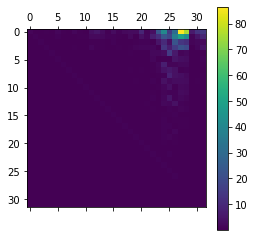

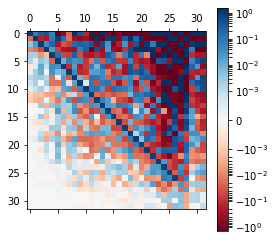

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

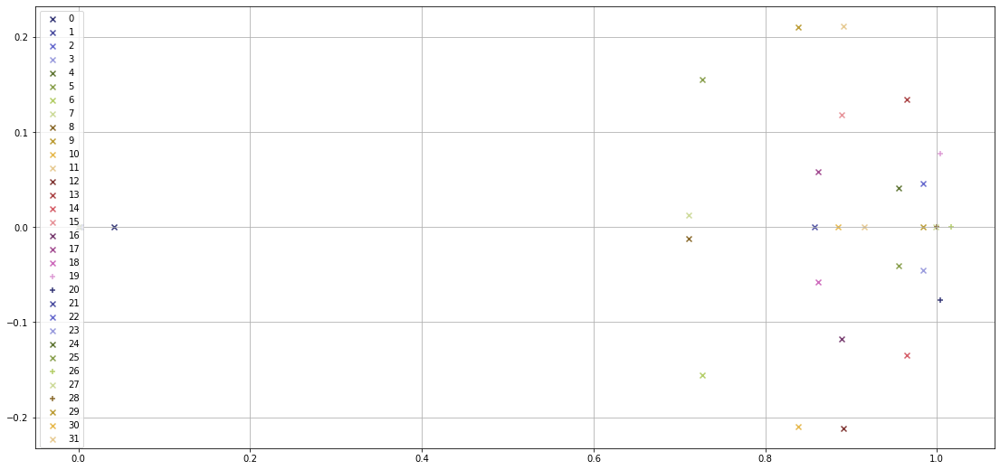

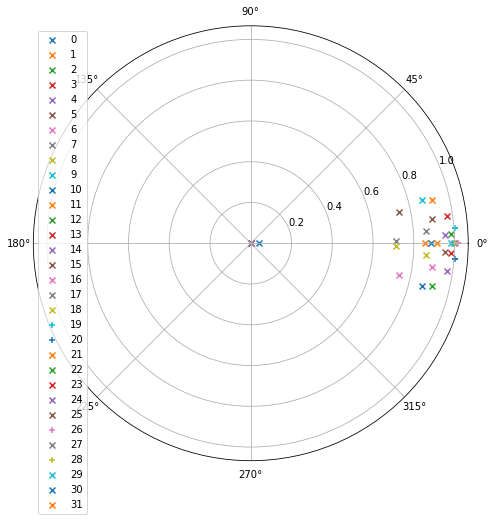

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-22,4.0,84.714286,1986.714286,1671.285714,4.370000,48.964286,59.000000,17.142857,6.000000,9.428571,...,42.057203,87.805681,89.024063,81.281236,86.203752,89.115309,88.655185,89.246586,91.215478,89.025906
2021-09-23,4.0,83.714286,2069.142857,1617.142857,4.184286,48.342857,57.714286,16.428571,5.285714,9.857143,...,41.899648,87.799336,89.015160,81.276969,86.196796,89.110466,88.650681,89.242304,91.211885,89.014319
2021-09-24,4.0,82.428571,2047.000000,1605.285714,4.155714,46.741429,58.285714,16.571429,5.428571,9.571429,...,41.742094,87.793088,89.006181,81.272586,86.190042,89.105765,88.645900,89.238264,91.208397,89.002827
2021-09-25,4.0,81.000000,2080.714286,1565.428571,3.867143,45.751429,58.571429,17.428571,4.857143,9.714286,...,41.584548,87.786948,88.996736,81.268665,86.183187,89.101278,88.641327,89.233982,91.204698,88.991905
2021-09-26,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-22,91.925531,2023.997457,4.173538,54.272355,56.100672,54.742297,64.305364,15.545599,18.943622,9.392178,...,42.549571,87.809941,88.965847,81.296199,86.180654,89.108869,88.686727,89.273681,91.211936,89.022695
2021-09-23,95.985981,2097.967791,4.236230,58.010099,57.681254,60.818822,66.505562,17.256618,19.304443,10.801876,...,42.352387,87.800516,88.960878,81.287935,86.173168,89.099353,88.675633,89.267212,91.205619,89.018668
2021-09-24,88.517431,2100.199042,3.973612,55.251753,58.532180,55.505275,66.979100,14.476343,18.185659,10.955868,...,42.169939,87.794158,88.954242,81.283292,86.166248,89.093702,88.668591,89.264687,91.202888,89.007335
2021-09-25,85.546892,2140.443677,3.841384,53.312207,58.806378,53.903404,67.040841,15.338740,17.954294,10.675834,...,42.000436,87.787787,88.948773,81.277949,86.159089,89.086334,88.660643,89.259747,91.199337,89.003880
2021-09-26,85.890673,2223.025805,3.691960,51.729736,58.531715,53.888844,66.534993,14.975026,17.951369,11.177653,...,41.842204,87.780029,88.936909,81.273995,86.152586,89.083808,88.656984,89.255510,91.196306,88.989407


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,...,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000,381.000000
mean,6.439976,6.004505,-1.093630,10.151964,2.943521,3.399045,-1.226511,2.396116,42.405263,8.400292,...,0.156246,-0.010664,-0.064246,-0.000266,-0.016189,-0.019322,0.035132,0.013543,-0.027206,-0.023206
std,5.974105,3.834442,4.414475,10.153492,3.843727,5.398262,1.846409,6.304649,37.030977,8.164292,...,0.205381,0.008072,0.026448,0.017851,0.018565,0.015973,0.041726,0.027037,0.012962,0.055428
min,-6.469306,-4.879216,-17.271078,-11.294208,-5.616654,-13.304055,-8.647113,-16.931914,-7.746441,-4.889696,...,-0.060373,-0.029131,-0.126417,-0.037033,-0.061210,-0.052731,-0.043062,-0.041599,-0.059689,-0.136560
25%,2.179613,3.580902,-3.845448,2.976775,0.344072,-0.005686,-2.154002,-1.234135,16.064732,2.254226,...,-0.005281,-0.013868,-0.083754,-0.012385,-0.024744,-0.029501,0.003554,-0.008197,-0.034900,-0.076927
50%,5.461131,5.495501,-1.063982,8.534016,2.353039,2.853309,-1.124123,1.741747,34.618927,6.397347,...,0.053774,-0.010550,-0.063819,0.003258,-0.014830,-0.022467,0.024685,0.015642,-0.027351,-0.015659
75%,9.834023,8.398548,2.032066,14.755480,5.429939,6.494819,-0.284339,5.360396,61.899257,12.898214,...,0.319029,-0.007538,-0.043983,0.011063,-0.005179,-0.007507,0.077392,0.036090,-0.018636,0.020258
max,26.917086,21.649136,12.525856,48.487413,19.427351,22.694191,8.763982,25.120024,267.255576,43.308079,...,0.733354,0.112659,0.028420,0.111035,0.125541,0.082348,0.158242,0.111254,0.061768,0.195480


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                          96.571429
test coresp                  1740.571429
Tasa de positividad (%)         5.402857
Asintomáticos                  46.188571
Asintomáticos (%)              47.714286
Zaragoza                       68.857143
Zaragoza (%)                   72.798303
1 a 14 años                    23.285714
15 a 24 años                    9.142857
25 a 34 años                    8.571429
35 a 44 años                   17.714286
45 a 54 años                   13.285714
55 a 64 años                    8.000000
65 a 74 años                    5.000000
75 años o más                   7.857143
Camas Ocup                    169.714286
Camas libres                 1427.857143
Camas (%)                      11.902832
UCI ocupadas                   35.857143
UCI libres con resp            97.571429
UCI (%)                        36.874108
Rs                              0.710481
Rd                              0.678780
Inoculados                     43.714137
Total Casos     

Casos                          89.285714
test coresp                  1763.857143
Tasa de positividad (%)         4.921429
Asintomáticos                  42.477143
Asintomáticos (%)              48.142857
Zaragoza                       63.142857
Zaragoza (%)                   72.337552
1 a 14 años                    21.714286
15 a 24 años                    8.571429
25 a 34 años                    7.428571
35 a 44 años                   16.142857
45 a 54 años                   12.285714
55 a 64 años                    8.000000
65 a 74 años                    4.714286
75 años o más                   6.857143
Camas Ocup                    163.857143
Camas libres                 1438.142857
Camas (%)                      11.398346
UCI ocupadas                   34.857143
UCI libres con resp            98.428571
UCI (%)                        35.435616
Rs                              0.693553
Rd                              0.664905
Inoculados                     43.497022
Total Casos     

Casos                         104.703113
test coresp                  1959.906469
Tasa de positividad (%)         4.711827
Asintomáticos                  56.454940
Asintomáticos (%)              50.593359
Zaragoza                       67.905066
Zaragoza (%)                   71.689247
1 a 14 años                    23.220279
15 a 24 años                   19.078294
25 a 34 años                   10.492632
35 a 44 años                   15.804925
45 a 54 años                   11.539350
55 a 64 años                    6.399009
65 a 74 años                    4.609869
75 años o más                   5.523577
Camas Ocup                    166.903424
Camas libres                 1412.785868
Camas (%)                      12.543182
UCI ocupadas                   34.845534
UCI libres con resp           100.042096
UCI (%)                        34.824382
Rs                              0.716542
Rd                              0.811861
Inoculados                     43.650014
Total Casos     

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-09-12,1.0,0.0,0.0,0.000,11.016,31.0,0.0
2021-09-13,1.0,0.0,0.0,0.926,4.264,121.0,0.0
2021-09-14,1.0,0.0,0.0,3.094,7.745,83.0,0.0
2021-09-15,1.0,0.0,0.0,8.176,13.822,128.0,0.0
2021-09-16,1.0,0.0,0.0,0.037,12.277,86.0,0.0
2021-09-17,1.0,0.0,0.0,7.677,7.676,92.0,0.0
2021-09-18,1.0,0.0,0.0,0.000,0.000,61.0,0.0
2021-09-19,1.0,0.0,0.0,0.001,0.005,51.0,0.0
2021-09-20,1.0,0.0,0.0,1.325,2.440,89.0,0.0
2021-09-21,1.0,0.0,0.0,5.713,7.122,130.0,0.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-18,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,8.114286
2021-09-19,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.541286
2021-09-20,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.280714
2021-09-21,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.191714
2021-09-22,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.848286
2021-09-23,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.448143
2021-09-24,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-25,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-26,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092286
2021-09-27,0.857143,0.000000,0.285714,0.714286,0.857143,0.142857,2.0,1.0,4.950571


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-18,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,8.114286
2021-09-19,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.541286
2021-09-20,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.280714
2021-09-21,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,6.191714
2021-09-22,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.848286
2021-09-23,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.448143
2021-09-24,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-25,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092571
2021-09-26,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,2.0,1.0,5.092286
2021-09-27,0.857143,0.000000,0.285714,0.714286,0.857143,0.142857,2.0,1.0,4.950571


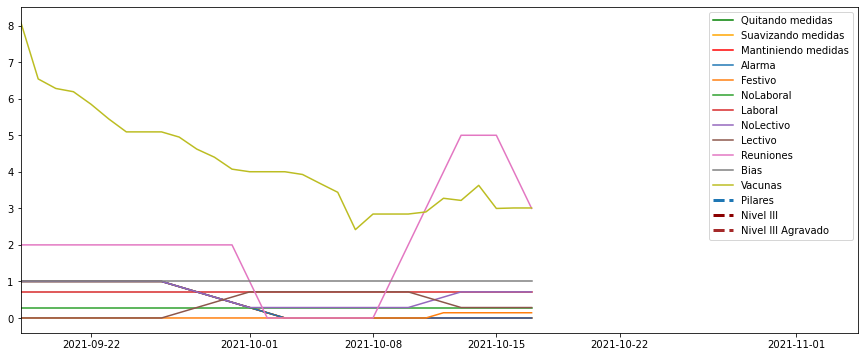

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
#x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
U1.loc['2021-10-12','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
U1.loc['2021-10-9':'2021-10-13','Reuniones']=7

U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
U1.loc['2021-10-9':'2021-10-13','Lectivo']=0
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 1 µs, sys: 0 ns, total: 1 µs
Wall time: 3.1 µs


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892858,48.158571,54.571429,60.428571,66.783741,18.857142,8.285714,7.857143,...,42.792562,87.832746,89.060893,81.302105,86.228673,89.137540,88.674816,89.265450,91.227286,89.068592
2021-09-19,88.787165,1850.497944,5.023857,51.786788,55.667280,61.713076,68.108116,17.821554,16.403274,7.476979,...,42.721532,87.825828,89.044229,81.293317,86.230332,89.145436,88.699202,89.262943,91.220664,89.037575
2021-09-20,91.150069,1890.678642,5.122732,57.043524,56.943436,65.071314,69.265221,17.117448,25.358781,7.977752,...,42.649797,87.822211,89.041036,81.271639,86.231290,89.142151,88.696247,89.262025,91.213888,89.039143
2021-09-21,94.976701,1936.414380,5.180041,63.326161,58.278283,69.934988,70.336829,16.679129,34.474803,9.183097,...,42.577037,87.818596,89.038489,81.242252,86.233626,89.139590,88.694318,89.261524,91.207877,89.043401
2021-09-22,99.421079,1987.186268,5.183317,70.111736,59.600742,75.606536,71.347755,16.446934,43.251323,10.923521,...,42.503622,87.815026,89.036191,81.205924,86.235910,89.137531,88.693750,89.261963,91.202950,89.049814
2021-09-23,103.617887,2041.188141,5.125233,76.869011,60.864304,81.351958,72.309879,16.360149,51.275218,13.017214,...,42.429729,87.811509,89.033960,81.163392,86.237540,89.135931,88.694664,89.263471,91.199170,89.058123
2021-09-24,106.754802,2095.736225,5.003304,83.097841,62.040341,86.476728,73.227939,16.361813,58.220519,15.284099,...,42.355402,87.808103,89.031661,81.115599,86.238132,89.134820,88.697174,89.266155,91.196571,89.068103
2021-09-25,108.123575,2147.698999,4.819002,88.359177,63.113371,90.372732,74.102605,16.400683,63.847683,17.556346,...,42.280616,87.804916,89.029208,81.063645,86.237485,89.134270,88.701386,89.270120,91.195186,89.079589
2021-09-26,107.147817,2193.843884,4.576777,92.292449,64.077305,92.543538,74.932573,16.431379,67.998919,19.684954,...,42.205322,87.802095,89.026557,81.008724,86.235557,89.134379,88.707394,89.275468,91.195047,89.092475
2021-09-27,103.393476,2231.103978,4.283101,94.622720,64.932461,92.614054,75.715950,16.413716,70.590509,21.543381,...,42.129471,87.799822,89.023706,80.952077,86.232445,89.135253,88.715280,89.282305,91.196190,89.106715


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892858,48.158571,54.571429,60.428571,66.783741,18.857142,8.285714,7.857143,...,42.792562,87.832746,89.060893,81.302105,86.228673,89.137540,88.674816,89.265450,91.227286,89.068592
2021-09-19,87.602048,1829.047425,4.781297,45.193518,53.773430,59.466845,67.157702,17.858022,8.613651,7.666883,...,42.553411,87.824515,89.052711,81.297268,86.203903,89.130290,88.655930,89.255260,91.228366,89.077440
2021-09-20,85.546685,1839.205495,4.666967,43.123645,53.540443,58.040100,67.588211,16.884707,9.298749,7.365684,...,42.349348,87.817349,89.038025,81.291871,86.196549,89.125917,88.658715,89.254585,91.225925,89.055294
2021-09-21,83.307655,1847.419907,4.555501,41.261160,53.470323,56.410553,67.924791,16.013417,10.032553,7.134521,...,42.150708,87.810428,89.028494,81.283969,86.188883,89.120110,88.653936,89.250658,91.222914,89.044477
2021-09-22,80.831267,1852.488095,4.449378,39.429012,53.473434,54.599738,68.183563,15.256396,10.637712,6.978119,...,41.953411,87.803606,89.020194,81.275009,86.181911,89.114620,88.648126,89.246128,91.219683,89.035596
2021-09-23,78.015150,1855.022831,4.341690,37.757224,53.587633,52.575711,68.409165,14.621464,11.047279,6.875514,...,41.763686,87.797155,89.011626,81.266018,86.175943,89.110254,88.644312,89.242512,91.216519,89.025119
2021-09-24,74.835656,1855.645845,4.226872,36.280388,53.805795,50.311604,68.615311,14.109926,11.198463,6.816538,...,41.583144,87.791183,89.003426,81.257018,86.170744,89.106563,88.641377,89.239425,91.213463,89.015023
2021-09-25,71.266501,1854.554817,4.102026,34.955335,54.098683,47.773434,68.805558,13.711445,11.035545,6.784467,...,41.410897,87.785704,88.995876,81.248113,86.166162,89.103228,88.638652,89.236594,91.210551,89.006364
2021-09-26,67.357714,1851.122604,3.971631,33.548898,54.365017,44.938407,68.951249,13.399970,10.510660,6.767332,...,41.238621,87.780507,88.989844,81.239035,86.161463,89.099323,88.633824,89.232992,91.207795,89.001858
2021-09-27,63.059731,1845.204369,3.837072,32.026705,54.601855,41.773816,69.065454,13.146444,9.650279,6.726421,...,41.066288,87.775629,88.984027,81.230584,86.156939,89.095489,88.629164,89.229609,91.205335,88.998262


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892858,48.158571,54.571429,60.428571,66.783741,18.857142,8.285714,7.857143,...,42.792562,87.832746,89.060893,81.302105,86.228673,89.137540,88.674816,89.265450,91.227286,89.068592
2021-09-19,87.602048,1829.047425,4.781297,45.193518,53.773430,59.466845,67.157702,17.858022,8.613651,7.666883,...,42.553411,87.824515,89.052711,81.297268,86.203903,89.130290,88.655930,89.255260,91.228366,89.077440
2021-09-20,85.546685,1839.205495,4.666967,43.123645,53.540443,58.040100,67.588211,16.884707,9.298749,7.365684,...,42.349348,87.817349,89.038025,81.291871,86.196549,89.125917,88.658715,89.254585,91.225925,89.055294
2021-09-21,83.307655,1847.419907,4.555501,41.261160,53.470323,56.410553,67.924791,16.013417,10.032553,7.134521,...,42.150708,87.810428,89.028494,81.283969,86.188883,89.120110,88.653936,89.250658,91.222914,89.044477
2021-09-22,80.831267,1852.488095,4.449378,39.429012,53.473434,54.599738,68.183563,15.256396,10.637712,6.978119,...,41.953411,87.803606,89.020194,81.275009,86.181911,89.114620,88.648126,89.246128,91.219683,89.035596
2021-09-23,78.015150,1855.022831,4.341690,37.757224,53.587633,52.575711,68.409165,14.621464,11.047279,6.875514,...,41.763686,87.797155,89.011626,81.266018,86.175943,89.110254,88.644312,89.242512,91.216519,89.025119
2021-09-24,74.835656,1855.645845,4.226872,36.280388,53.805795,50.311604,68.615311,14.109926,11.198463,6.816538,...,41.583144,87.791183,89.003426,81.257018,86.170744,89.106563,88.641377,89.239425,91.213463,89.015023
2021-09-25,71.266501,1854.554817,4.102026,34.955335,54.098683,47.773434,68.805558,13.711445,11.035545,6.784467,...,41.410897,87.785704,88.995876,81.248113,86.166162,89.103228,88.638652,89.236594,91.210551,89.006364
2021-09-26,67.357714,1851.122604,3.971631,33.548898,54.365017,44.938407,68.951249,13.399970,10.510660,6.767332,...,41.238621,87.780507,88.989844,81.239035,86.161463,89.099323,88.633824,89.232992,91.207795,89.001858
2021-09-27,63.059731,1845.204369,3.837072,32.026705,54.601855,41.773816,69.065454,13.146444,9.650279,6.726421,...,41.066288,87.775629,88.984027,81.230584,86.156939,89.095489,88.629164,89.229609,91.205335,88.998262


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-18,88.857143,1817.285714,4.892858,48.158571,54.571429,60.428571,66.783741,18.857142,8.285714,7.857143,...,42.792562,87.832746,89.060893,81.302105,86.228673,89.137540,88.674816,89.265450,91.227286,89.068592
2021-09-19,87.602048,1829.047425,4.781297,45.193518,53.773430,59.466845,67.157702,17.858022,8.613651,7.666883,...,42.553411,87.824515,89.052711,81.297268,86.203903,89.130290,88.655930,89.255260,91.228366,89.077440
2021-09-20,85.546685,1839.205495,4.666967,43.123645,53.540443,58.040100,67.588211,16.884707,9.298749,7.365684,...,42.349348,87.817349,89.038025,81.291871,86.196549,89.125917,88.658715,89.254585,91.225925,89.055294
2021-09-21,83.307655,1847.419907,4.555501,41.261160,53.470323,56.410553,67.924791,16.013417,10.032553,7.134521,...,42.150708,87.810428,89.028494,81.283969,86.188883,89.120110,88.653936,89.250658,91.222914,89.044477
2021-09-22,80.831267,1852.488095,4.449378,39.429012,53.473434,54.599738,68.183563,15.256396,10.637712,6.978119,...,41.953411,87.803606,89.020194,81.275009,86.181911,89.114620,88.648126,89.246128,91.219683,89.035596
2021-09-23,78.015150,1855.022831,4.341690,37.757224,53.587633,52.575711,68.409165,14.621464,11.047279,6.875514,...,41.763686,87.797155,89.011626,81.266018,86.175943,89.110254,88.644312,89.242512,91.216519,89.025119
2021-09-24,74.835656,1855.645845,4.226872,36.280388,53.805795,50.311604,68.615311,14.109926,11.198463,6.816538,...,41.583144,87.791183,89.003426,81.257018,86.170744,89.106563,88.641377,89.239425,91.213463,89.015023
2021-09-25,71.266501,1854.554817,4.102026,34.955335,54.098683,47.773434,68.805558,13.711445,11.035545,6.784467,...,41.410897,87.785704,88.995876,81.248113,86.166162,89.103228,88.638652,89.236594,91.210551,89.006364
2021-09-26,67.357714,1851.122604,3.971631,33.548898,54.365017,44.938407,68.951249,13.399970,10.510660,6.767332,...,41.238621,87.780507,88.989844,81.239035,86.161463,89.099323,88.633824,89.232992,91.207795,89.001858
2021-09-27,63.059731,1845.204369,3.837072,32.026705,54.601855,41.773816,69.065454,13.146444,9.650279,6.726421,...,41.066288,87.775629,88.984027,81.230584,86.156939,89.095489,88.629164,89.229609,91.205335,88.998262


CPU times: user 42.2 ms, sys: 2.5 ms, total: 44.7 ms
Wall time: 44.5 ms


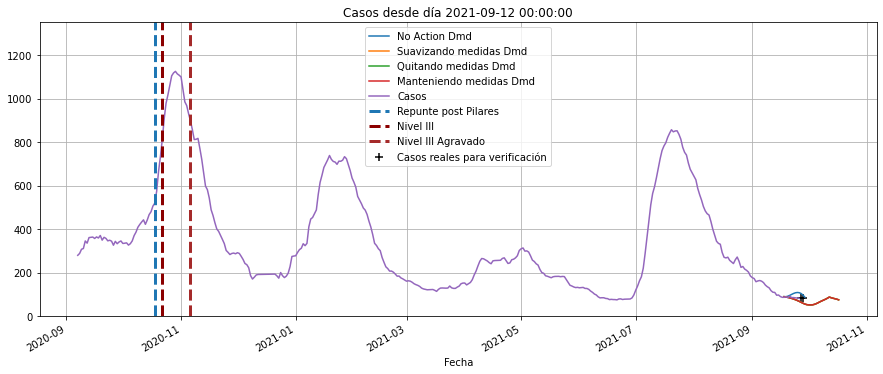

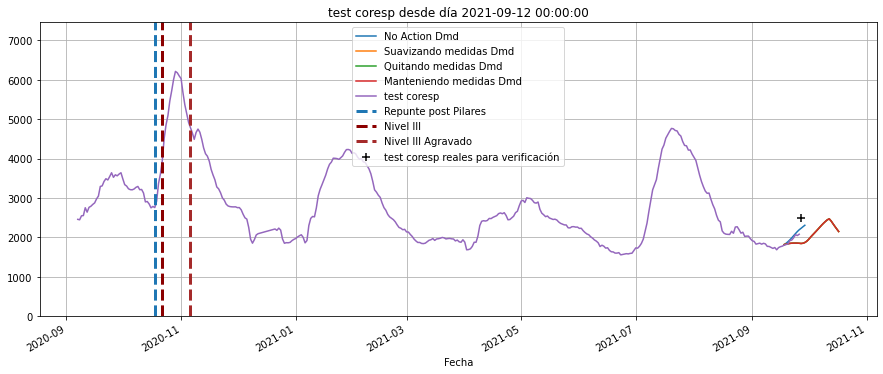

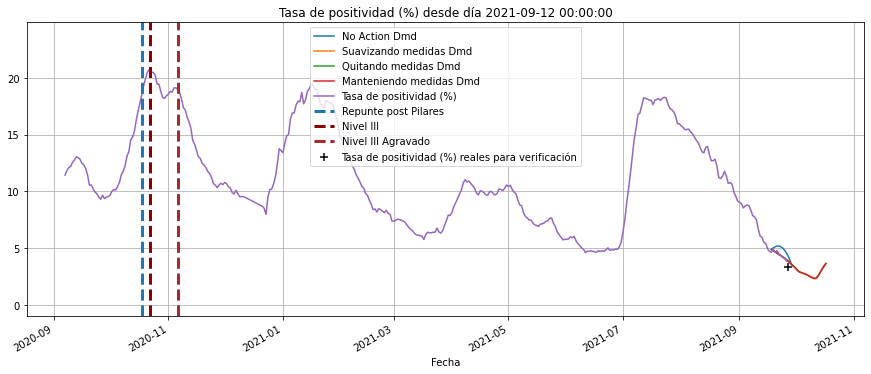

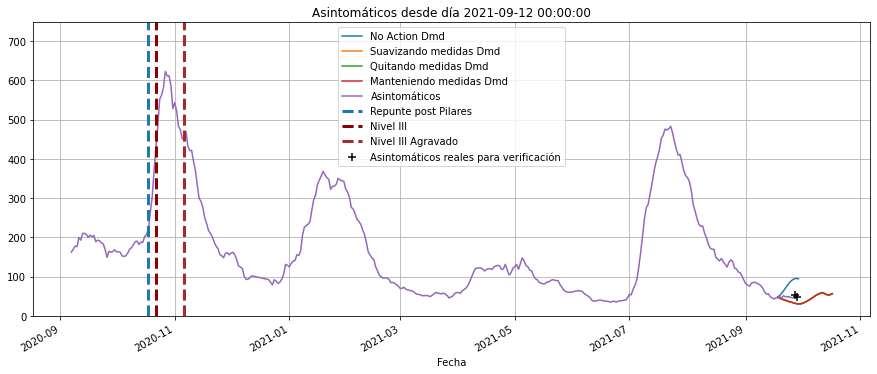

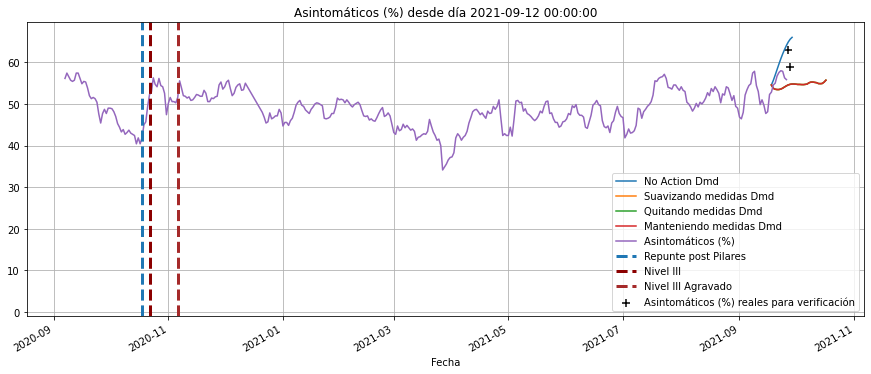

...

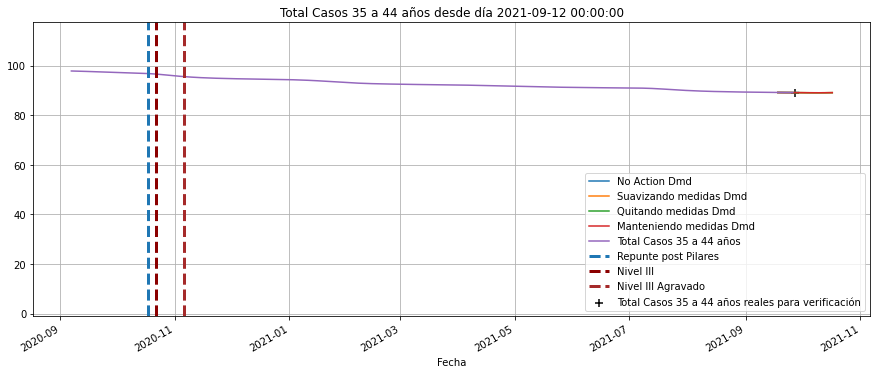

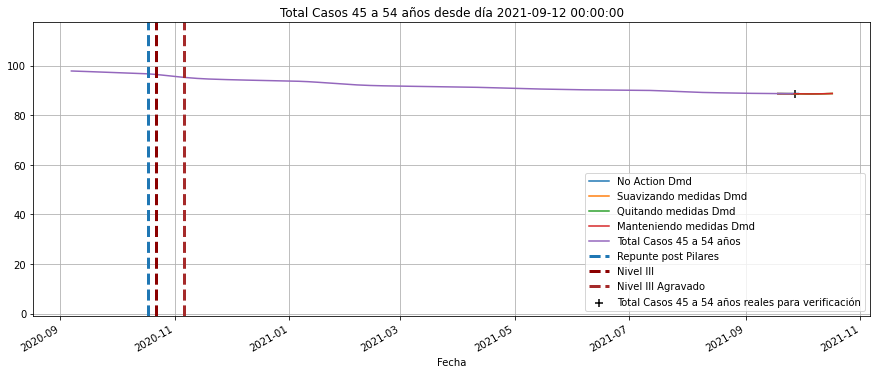

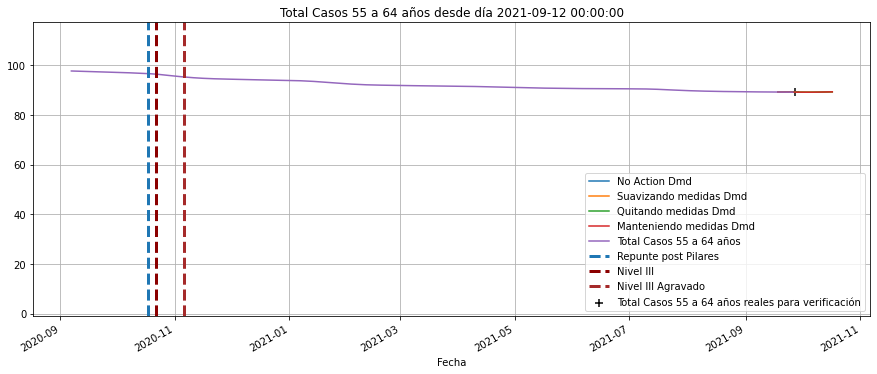

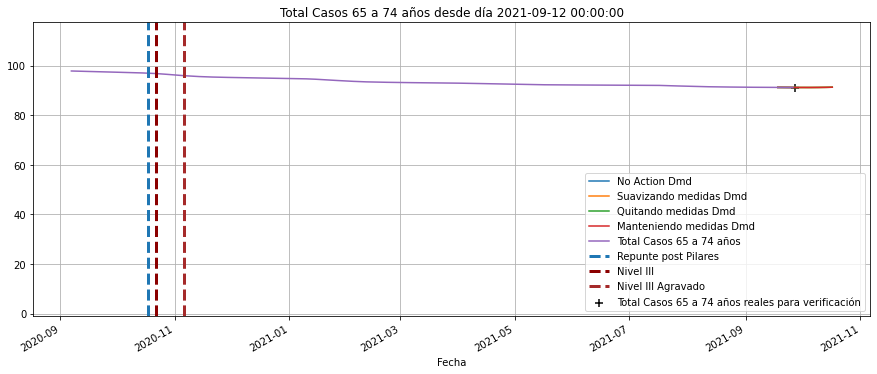

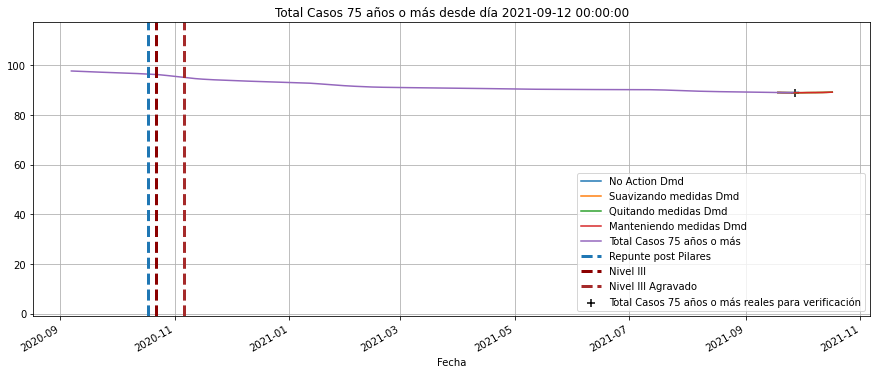

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

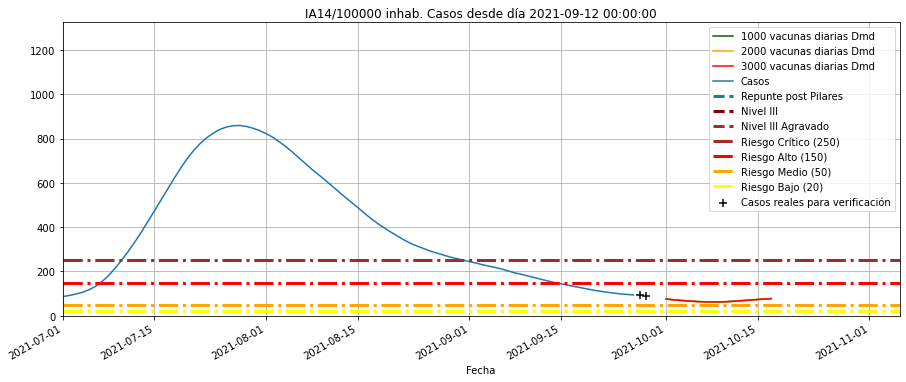

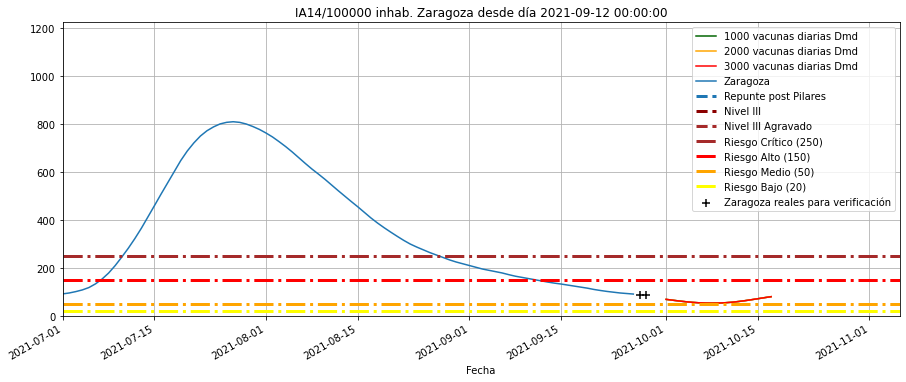

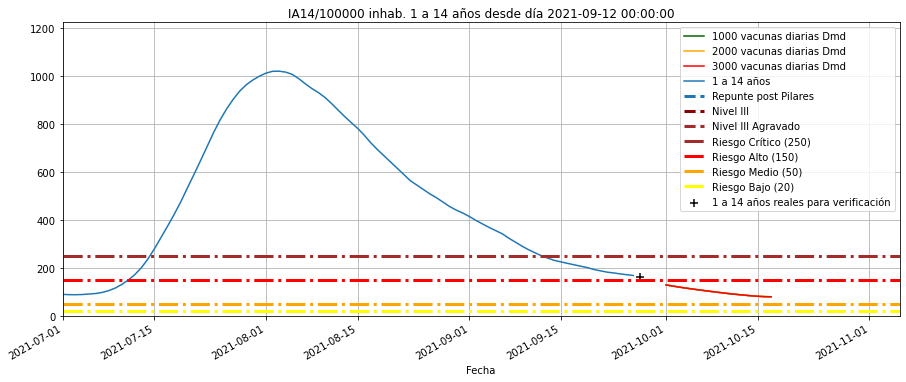

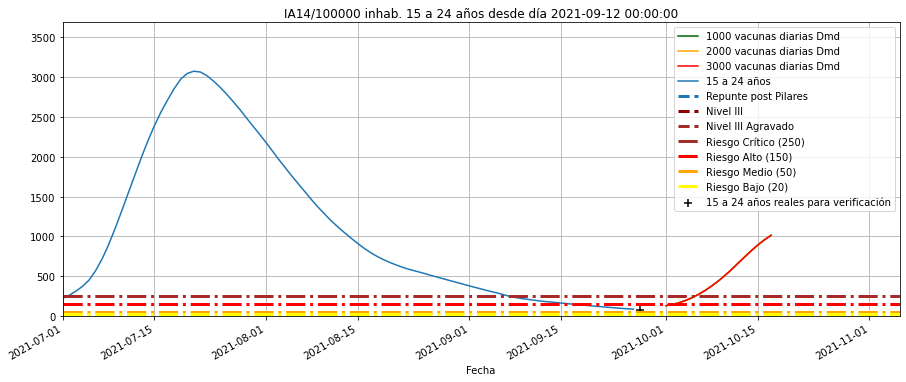

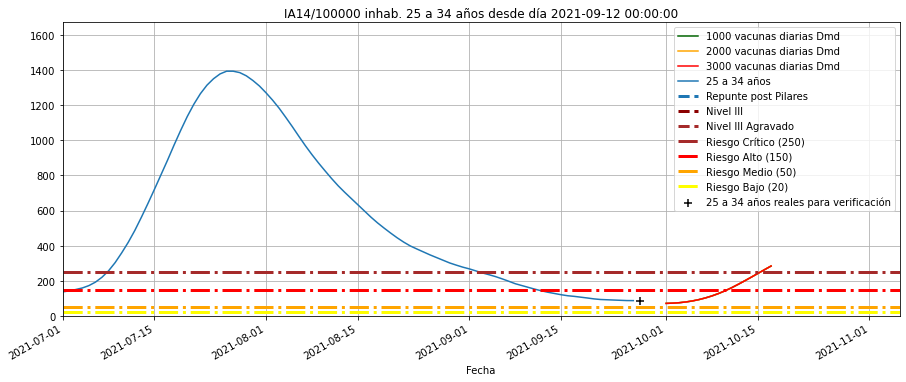

...

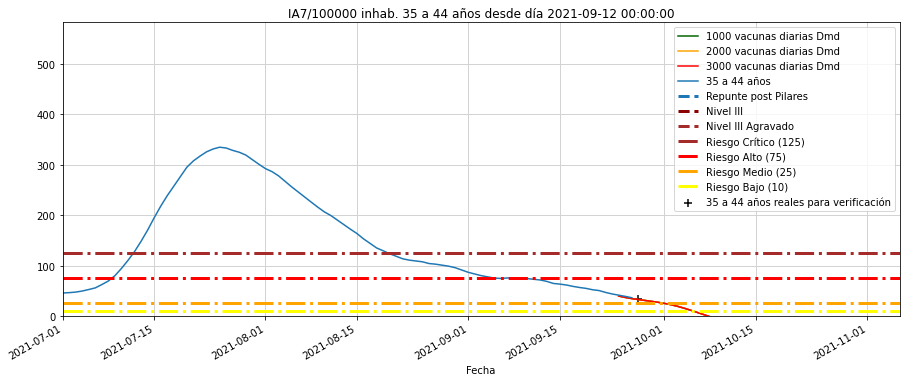

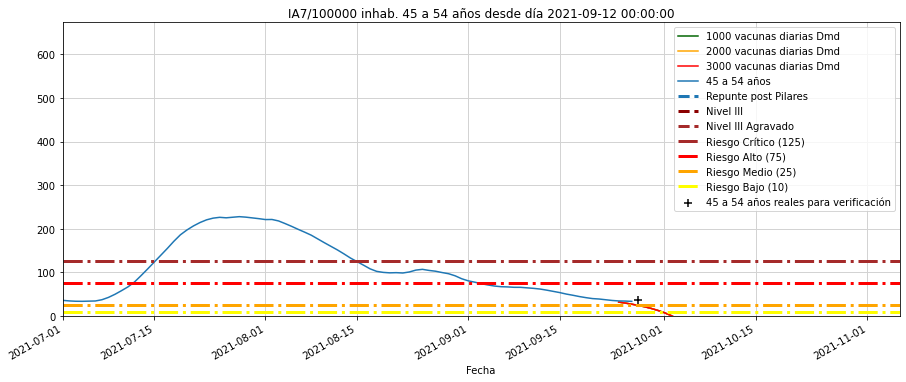

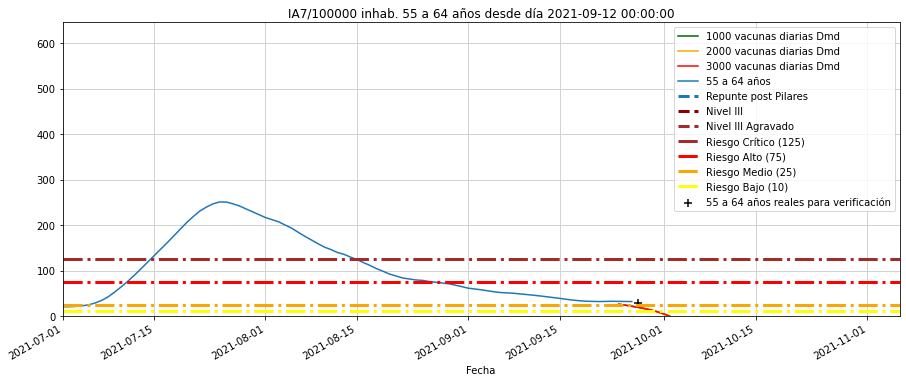

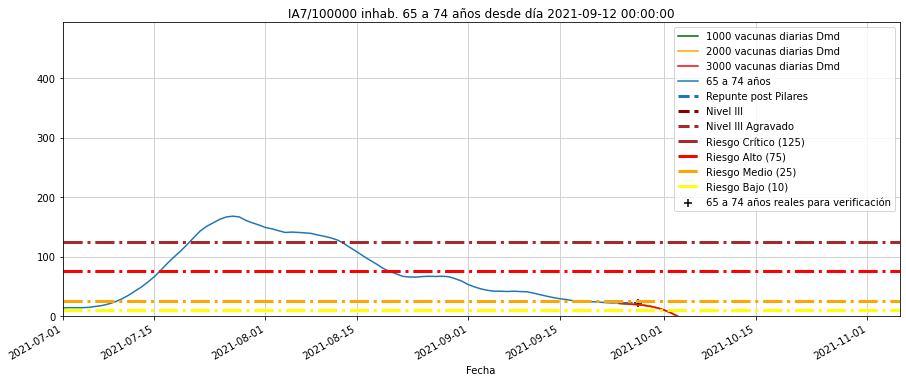

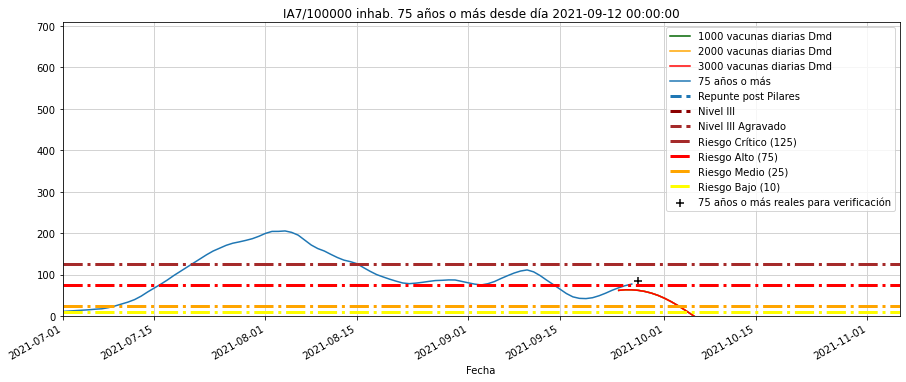

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-27,1,84.0,2484.0,1881.0,3.38,52.92,51.0,14.0,5.0,10.0,...,41.189920,87.765389,88.96554,81.253903,86.159799,89.086535,88.622549,89.22251,91.19022,88.950782
2021-09-28,2,82.0,NaN,NaN,NaN,48.38,63.0,NaN,NaN,NaN,...,41.040860,87.759173,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2021-09-29,3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,40.735594,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

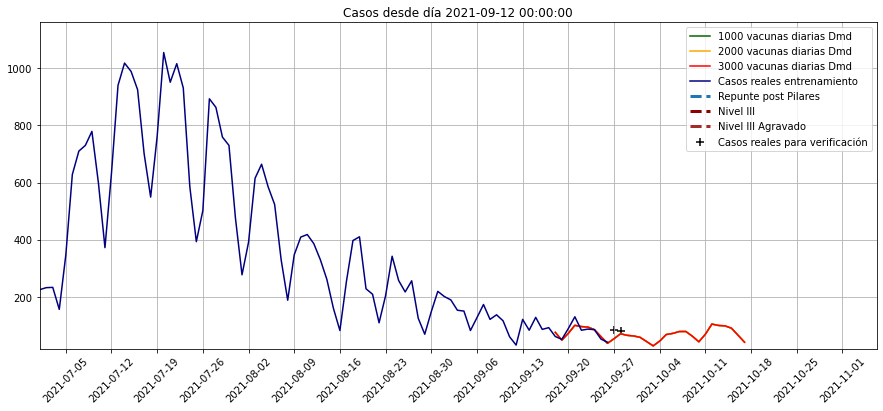

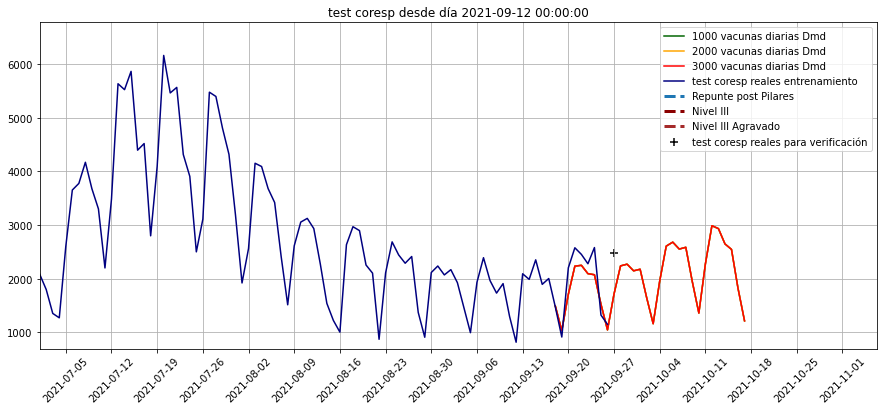

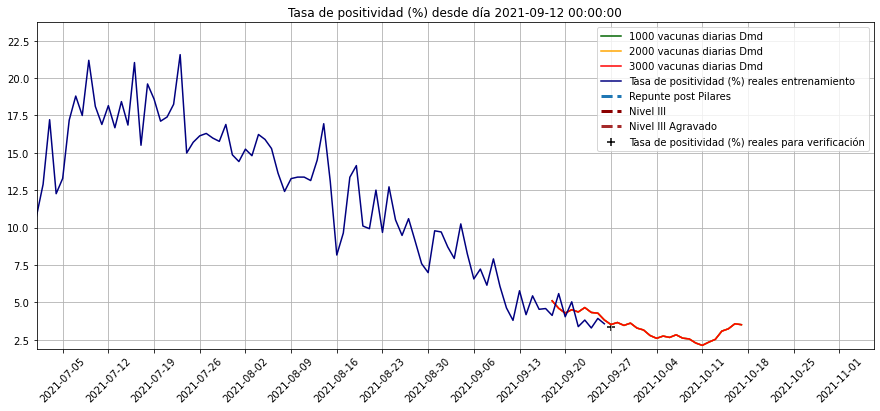

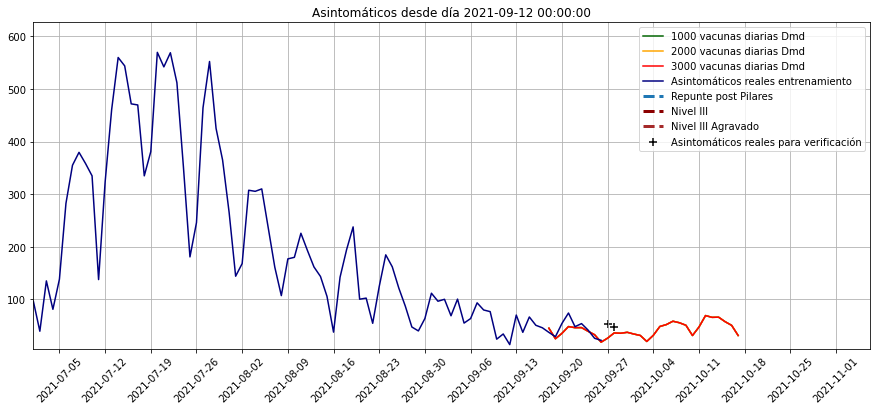

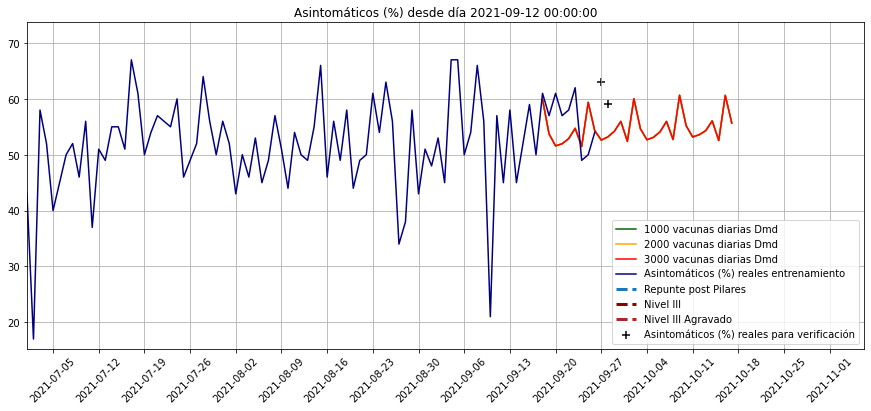

...

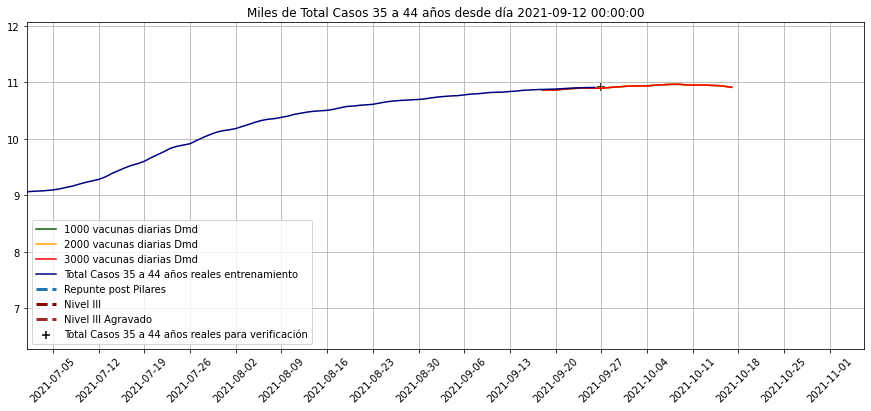

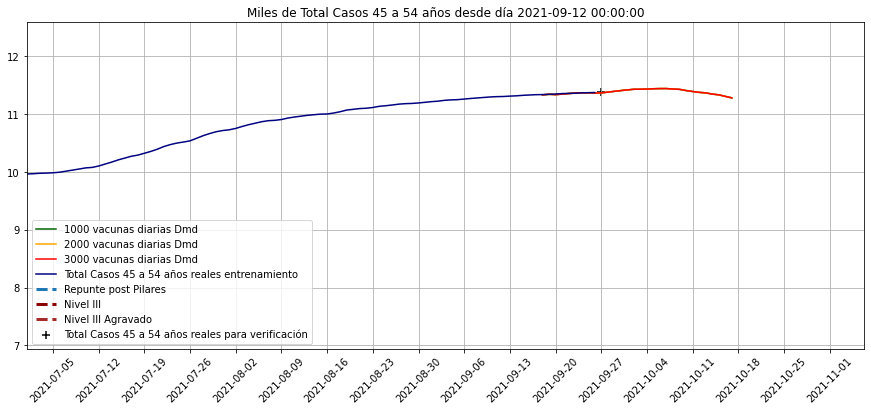

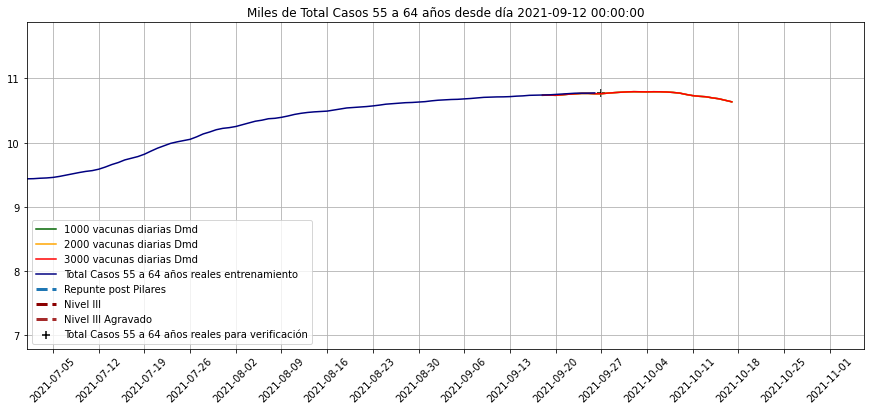

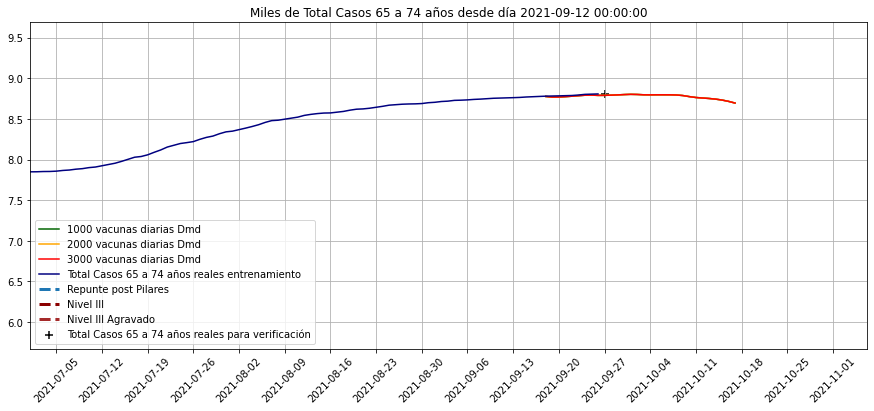

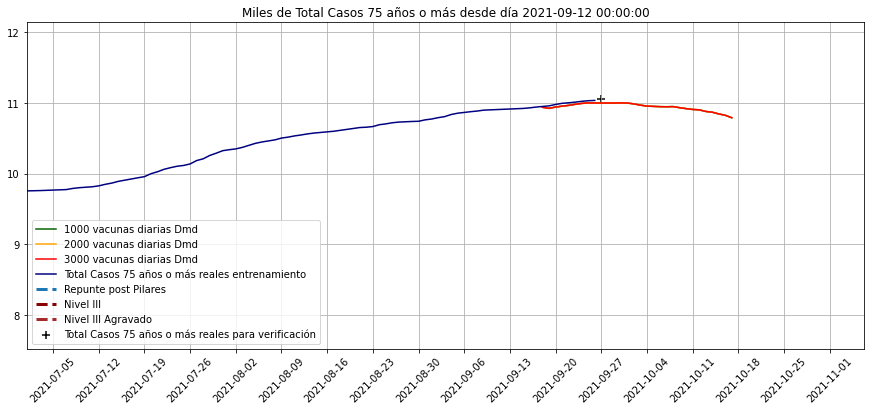

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index
kControl2.loc['Nº de pacientes a los que se ha realizado pruebas']=0

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-10-03'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas',
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-10-03'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-10-03,28,1161,0,3,55,15,19,108,61,1599,5,18,6,1,-6,-5,-2,-1
2021-10-02,43,1648,0,3,60,24,20,99,67,1637,11,23,8,3,-6,-5,-2,1
2021-10-01,58,2177,0,3,52,32,21,98,74,1620,14,25,10,6,-4,-4,-1,4
2021-09-30,63,2147,0,4,56,37,21,96,83,1468,15,20,9,7,-1,-2,0,7
2021-09-29,65,2271,0,3,54,41,22,98,89,1429,15,15,8,8,1,0,2,9
2021-09-28,71,2239,0,4,53,46,23,99,95,1422,16,12,8,9,4,2,3,12
2021-09-27,53,1714,0,4,53,32,24,101,102,1446,10,8,6,7,4,3,3,9
2021-09-26,37,1046,0,4,54,24,25,106,107,1606,6,5,4,5,3,2,2,8
2021-09-25,61,1526,0,4,59,43,25,98,105,1640,13,9,6,7,5,3,3,12
2021-09-24,85,2074,0,4,51,57,26,98,106,1615,17,13,8,11,8,5,4,15


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más,Nº de pacientes a los que se ha realizado pruebas
2021-09-18,75.545792,1494.843976,5.106806,45.181934,59.898310,53.877315,69.975633,17.467361,6.804611,6.608828,...,87.832746,89.053886,81.291401,86.222268,89.133287,88.670156,89.261534,91.223651,89.064245,0.0
2021-09-19,48.302080,1033.374341,4.605467,25.143621,53.722055,32.315050,66.358844,8.339449,4.419568,4.084788,...,87.824515,89.056356,81.304231,86.209152,89.134656,88.660635,89.259532,91.230814,89.079153,0.0
2021-09-20,72.247141,1708.824757,4.282492,35.430944,51.592758,44.788743,62.017316,12.256782,7.300866,6.155411,...,87.817349,89.047658,81.307951,86.206730,89.134034,88.666589,89.261984,91.230522,89.060762,0.0
2021-09-21,100.185640,2234.436032,4.513418,48.320447,51.965997,68.176936,68.010376,20.292351,11.790864,8.609980,...,87.810428,89.033709,81.294058,86.194009,89.123535,88.657808,89.253657,91.225881,89.048075,0.0
2021-09-22,95.802049,2249.988730,4.360310,46.199180,52.876226,65.958101,69.570929,18.350660,13.204884,8.240398,...,87.803606,89.020876,81.276047,86.182220,89.113714,88.647630,89.245109,91.220411,89.037355,0.0


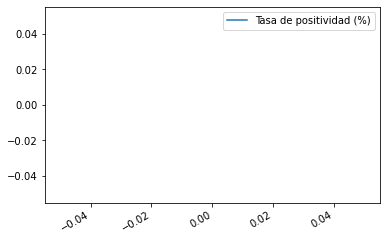

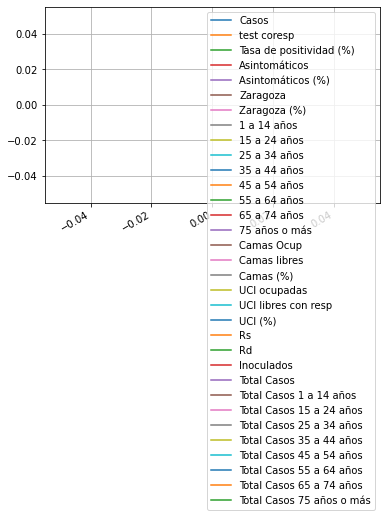

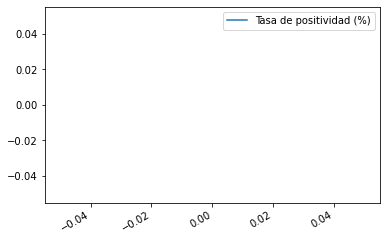

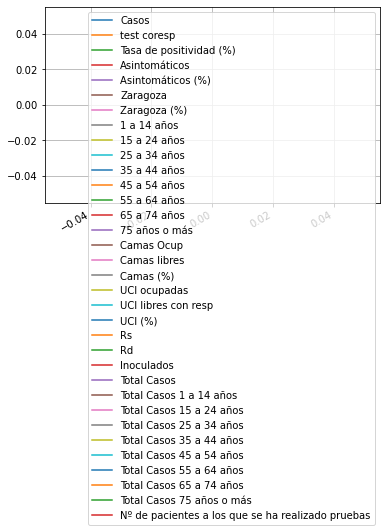

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-09-22     3.382233
2021-09-23     3.817464
2021-09-24     3.293297
2021-09-25     3.933434
2021-09-26     3.568320
Length: 361, dtype: float64

<AxesSubplot:xlabel='Fecha'>

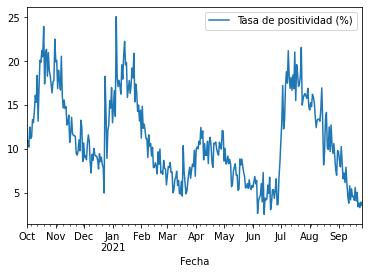

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,1.0,-31.834725,NaN,-31.834725,-31.834725,-31.834725,-31.834725,-31.834725
15 a 24 años,1.0,51.537358,NaN,51.537358,51.537358,51.537358,51.537358,51.537358
25 a 34 años,1.0,-43.788126,NaN,-43.788126,-43.788126,-43.788126,-43.788126,-43.788126
35 a 44 años,1.0,0.010684,NaN,0.010684,0.010684,0.010684,0.010684,0.010684
45 a 54 años,1.0,-73.825139,NaN,-73.825139,-73.825139,-73.825139,-73.825139,-73.825139
55 a 64 años,1.0,-37.057654,NaN,-37.057654,-37.057654,-37.057654,-37.057654,-37.057654
65 a 74 años,1.0,-11.261936,NaN,-11.261936,-11.261936,-11.261936,-11.261936,-11.261936
75 años o más,1.0,-63.993198,NaN,-63.993198,-63.993198,-63.993198,-63.993198,-63.993198
Asintomáticos,2.0,-37.736882,17.734023,-50.276730,-44.006806,-37.736882,-31.466957,-25.197033
Asintomáticos (%),2.0,-13.166821,4.690125,-16.483240,-14.825031,-13.166821,-11.508611,-9.850402


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-09-27    1881.0
2021-09-28       NaN
2021-09-29       NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

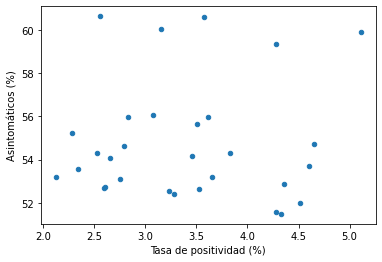

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

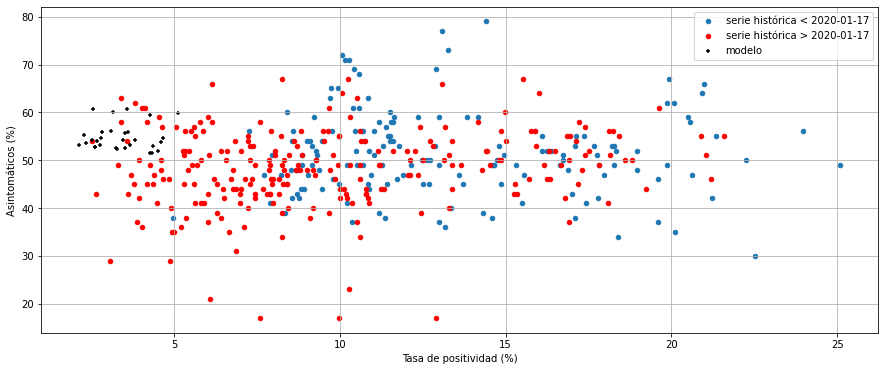

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más',
       'Nº de pacientes a los que se ha realizado pruebas'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24,2021-09-25,2021-09-26,2021-09-27,2021-09-28,2021-09-29
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,89.000000,130.000000,83.000000,8.700000e+01,85.000000,52.000000,41.000000,84.000000,82.000000,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,2203.000000,2577.000000,2454.000000,2.279000e+03,2581.000000,1322.000000,1149.000000,2484.000000,NaN,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,1938.000000,2000.000000,1969.000000,1.717000e+03,1755.000000,911.000000,668.000000,1881.000000,NaN,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,4.040000,5.040000,3.380000,3.820000e+00,3.290000,3.930000,3.570000,3.380000,NaN,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,54.290000,74.100000,48.140000,5.394000e+01,41.650000,26.000000,22.140000,52.920000,48.380000,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,44.000000,105.000000,67.000000,6.100000e+01,59.000000,45.000000,29.000000,51.000000,63.000000,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,15.000000,34.000000,18.000000,1.900000e+01,13.000000,12.000000,11.000000,14.000000,NaN,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,3.000000,5.000000,8.000000,8.000000e+00,4.000000,4.000000,2.000000,5.000000,NaN,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,9.000000,20.000000,9.000000,6.000000e+00,17.000000,4.000000,3.000000,10.000000,NaN,NaN


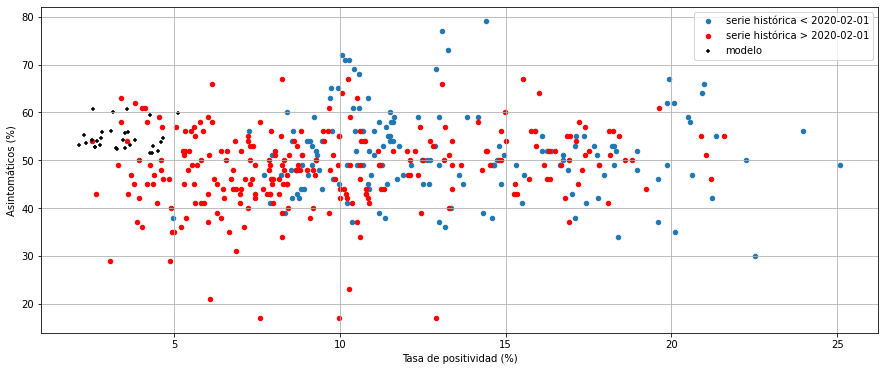

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,0.145989
Asintomáticos (%),0.145989,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

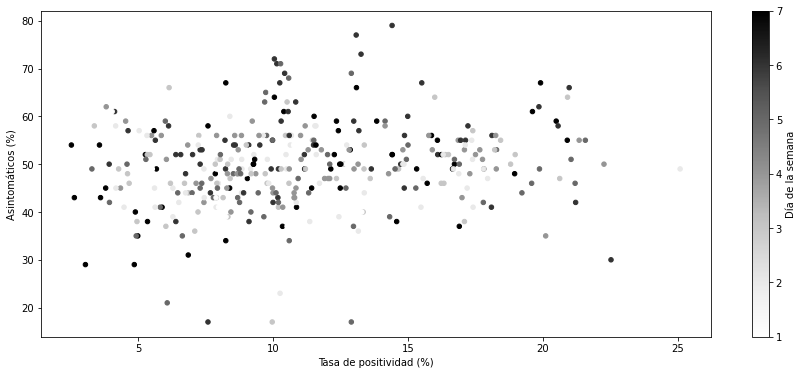

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-09-18,2021-09-19,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24,2021-09-25,2021-09-26,2021-09-27,...,2021-10-08,2021-10-09,2021-10-10,2021-10-11,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17
Casos,75.545792,48.302080,72.247141,100.185640,95.802049,93.969130,84.903249,60.590337,37.139745,53.256129,...,78.616270,62.176527,42.552621,68.980758,104.529866,99.696790,98.380164,90.082730,65.643426,41.052794
test coresp,1494.843976,1033.374341,1708.824757,2234.436032,2249.988730,2094.525864,2074.222980,1525.500406,1045.846365,1714.398373,...,2586.186028,1942.868884,1359.639690,2274.166500,2988.471803,2934.113765,2649.402880,2546.589052,1820.683726,1214.359357
Tasa de positividad (%),5.106806,4.605467,4.282492,4.513418,4.360310,4.655477,4.328067,4.281393,3.825577,3.520966,...,2.609761,2.558235,2.285395,2.127882,2.342415,2.528903,3.080443,3.234199,3.571101,3.510595
Asintomáticos,45.181934,25.143621,35.430944,48.320447,46.199180,46.340294,39.384608,32.794778,18.665083,26.313555,...,55.560749,50.742767,31.245593,47.484000,69.217820,65.818484,66.167259,57.594232,50.611132,31.310431
Asintomáticos (%),59.898310,53.722055,51.592758,51.965997,52.876226,54.733140,51.481685,59.379419,54.313077,52.615558,...,52.721472,60.647243,55.221573,53.186650,53.576773,54.303813,56.062672,52.550388,60.632847,55.670122
Zaragoza,53.877315,32.315050,44.788743,68.176936,65.958101,63.726818,57.417347,42.594162,24.420109,32.236276,...,53.658975,46.296560,30.801627,47.328244,80.531248,82.298751,83.906484,79.002184,61.008160,36.244791
Zaragoza (%),69.975633,66.358844,62.017316,68.010376,69.570929,69.248336,69.595832,72.094082,68.131056,63.372799,...,71.497002,74.469550,70.636776,65.803893,72.022458,74.083589,74.068107,74.557458,77.294168,73.172280
1 a 14 años,17.467361,8.339449,12.256782,20.292351,18.350660,17.741136,16.633529,12.700905,6.257601,9.543138,...,10.189574,7.718869,3.822050,5.976476,10.836844,9.991139,10.164330,10.229425,8.575503,4.674362
15 a 24 años,6.804611,4.419568,7.300866,11.790864,13.204884,13.892034,13.176178,9.062899,5.392901,7.576868,...,95.352795,72.745368,49.162385,80.545038,127.199167,136.928367,139.793961,130.117585,89.391936,54.010640
25 a 34 años,6.608828,4.084788,6.155411,8.609980,8.240398,8.337952,7.886451,5.706575,3.605523,5.621187,...,26.915643,21.957603,15.384053,26.417495,41.266738,42.150918,44.870966,44.416770,33.417602,21.870335


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

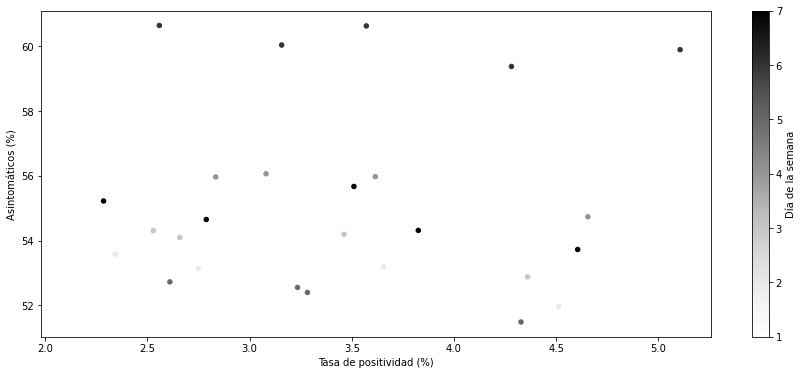

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

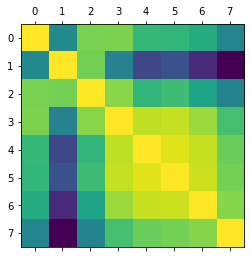

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

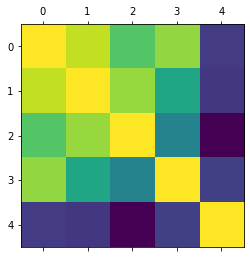

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

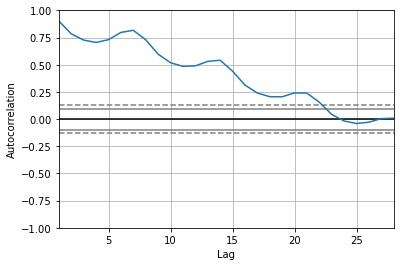

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

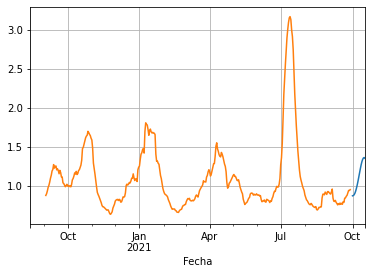

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

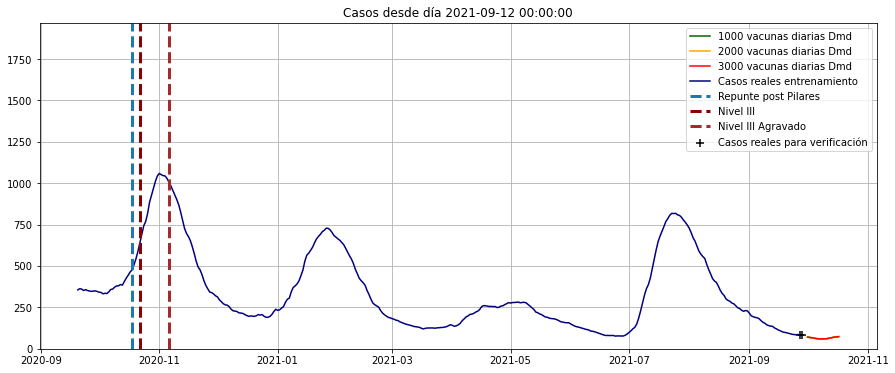

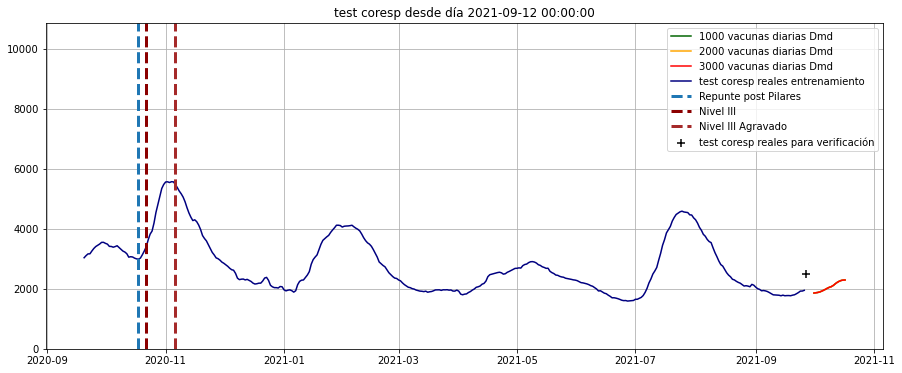

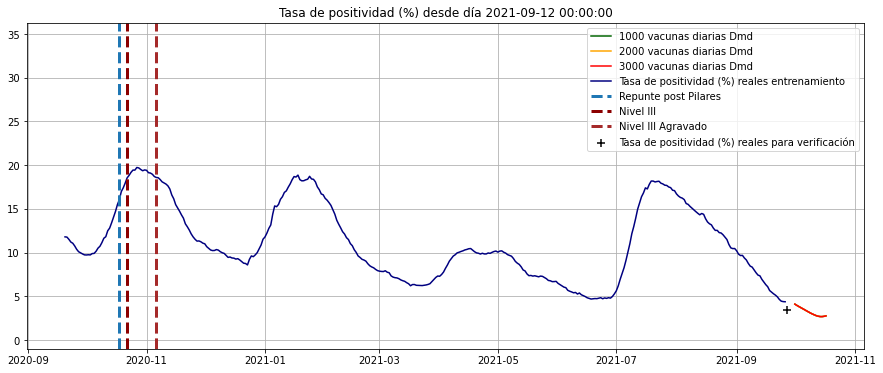

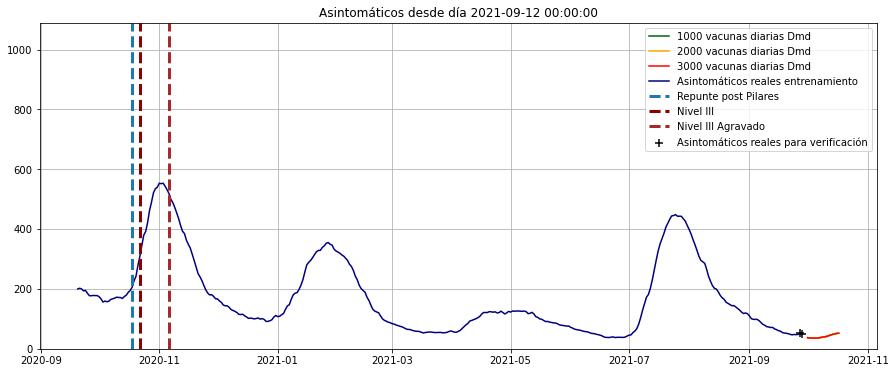

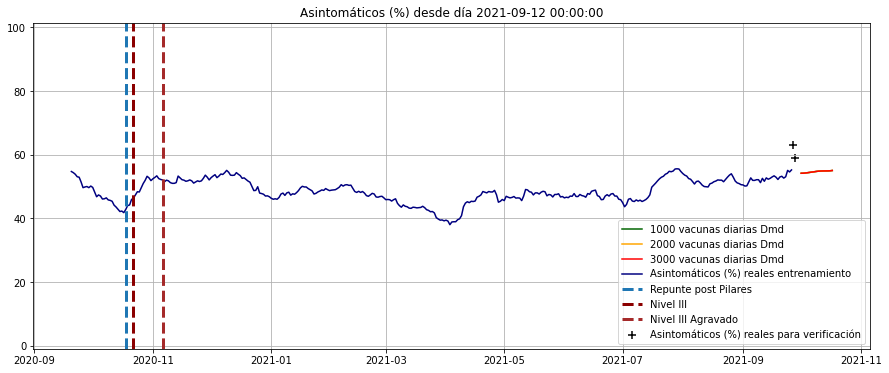

...

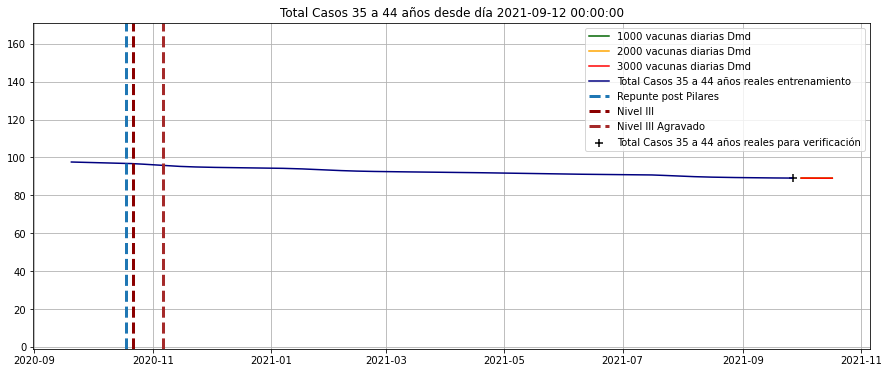

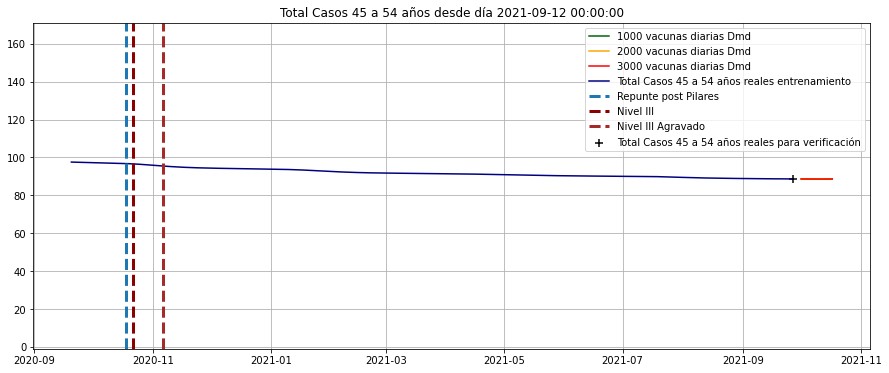

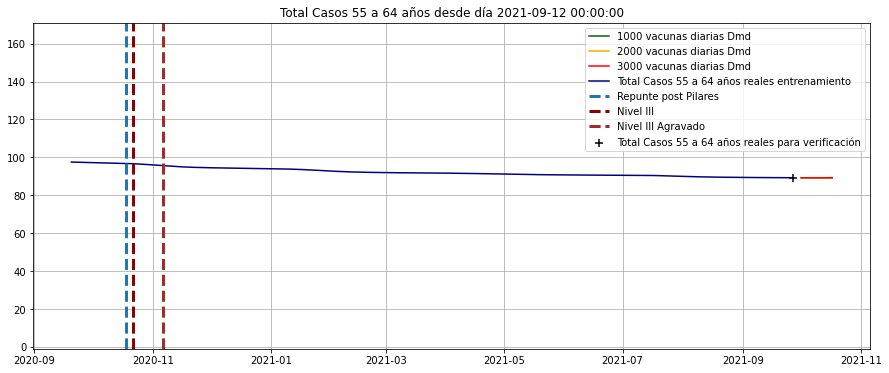

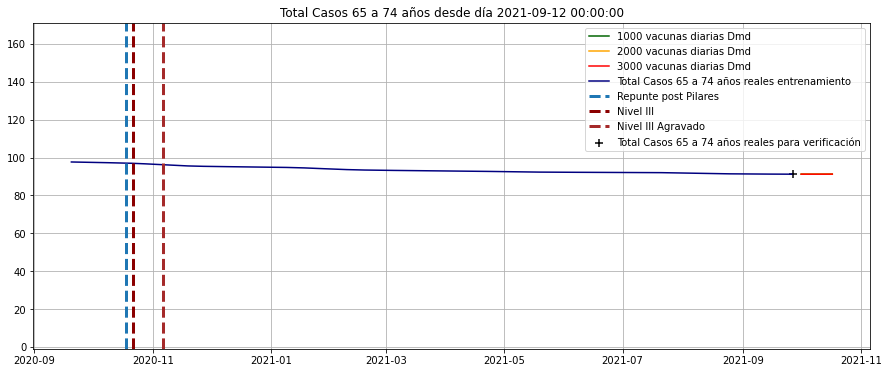

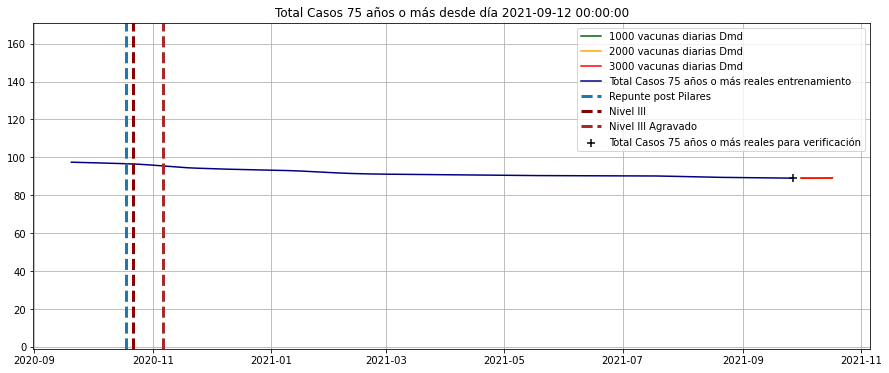

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

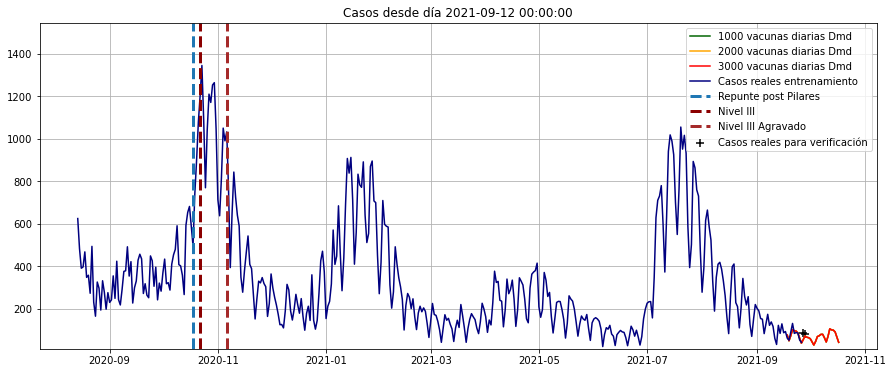

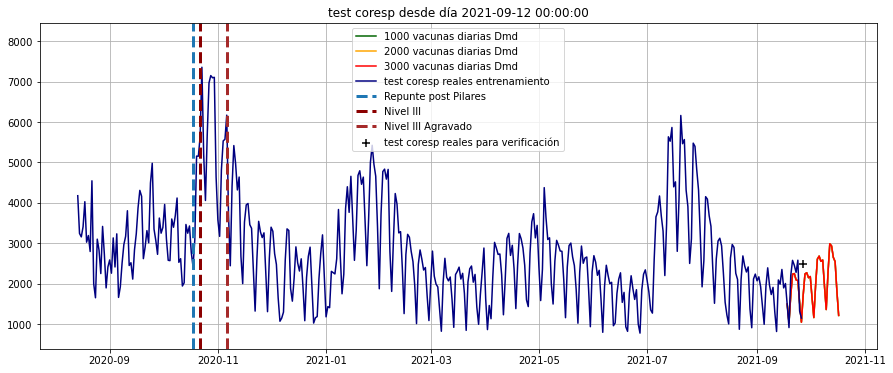

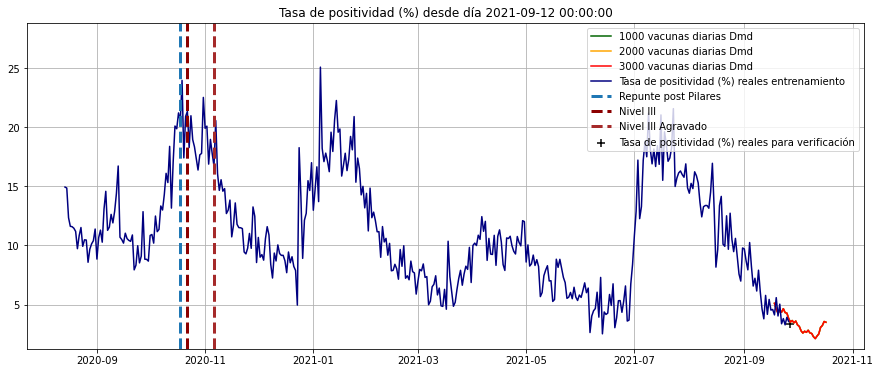

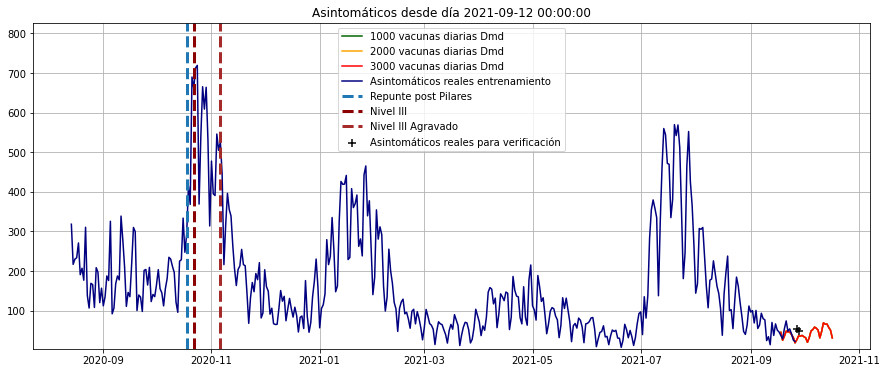

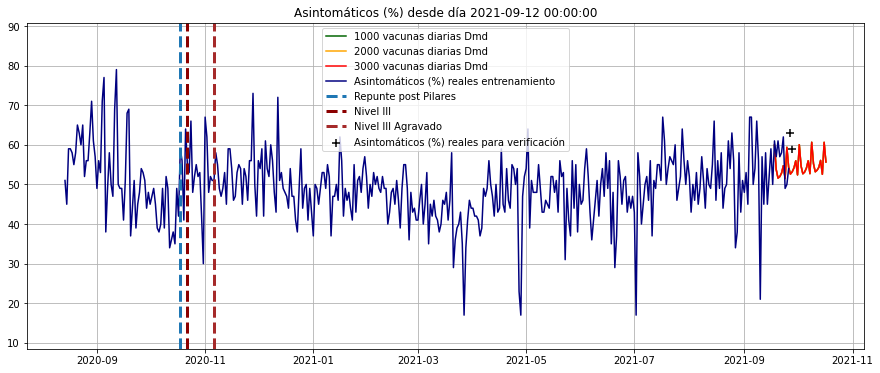

...

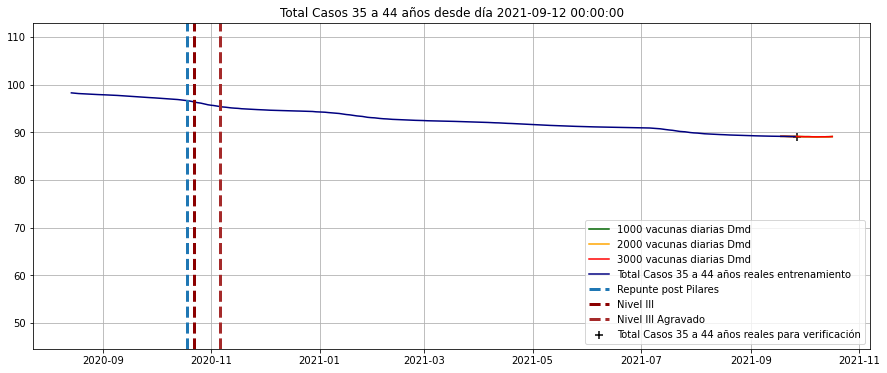

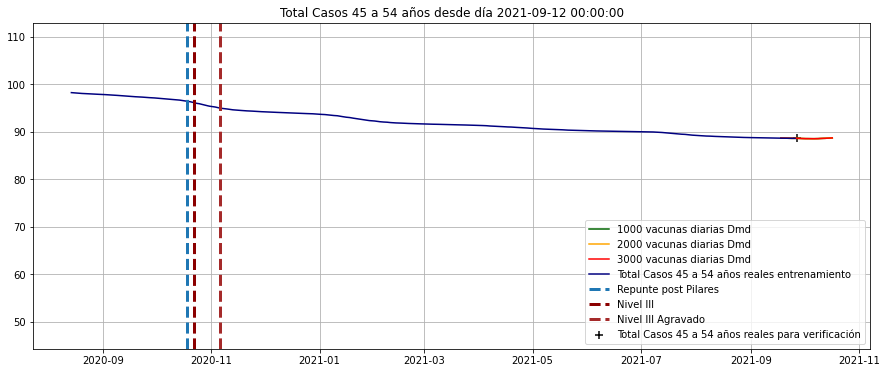

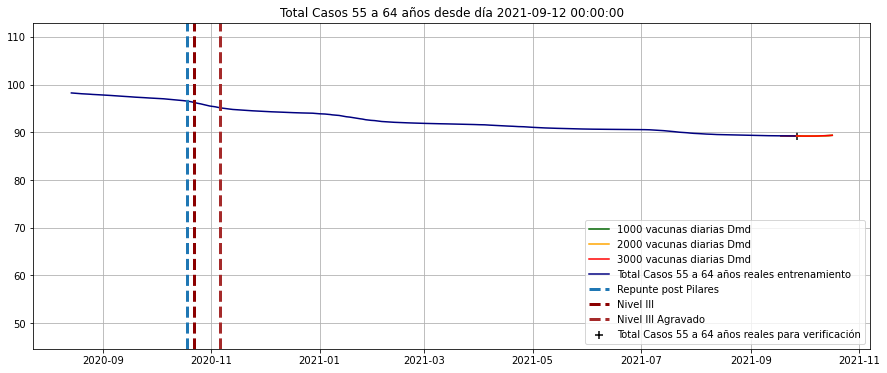

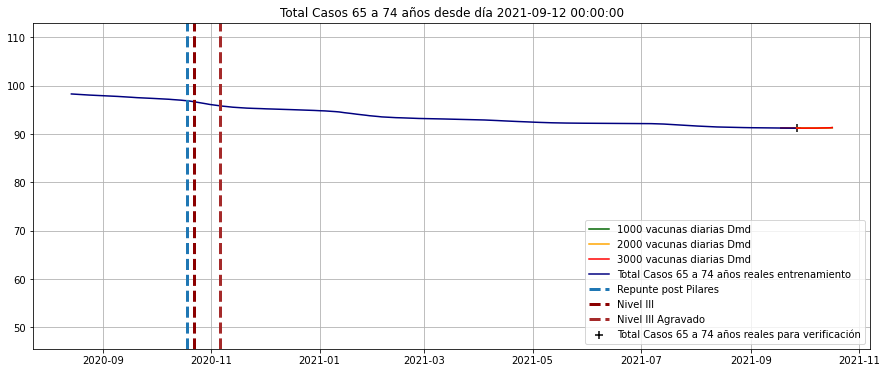

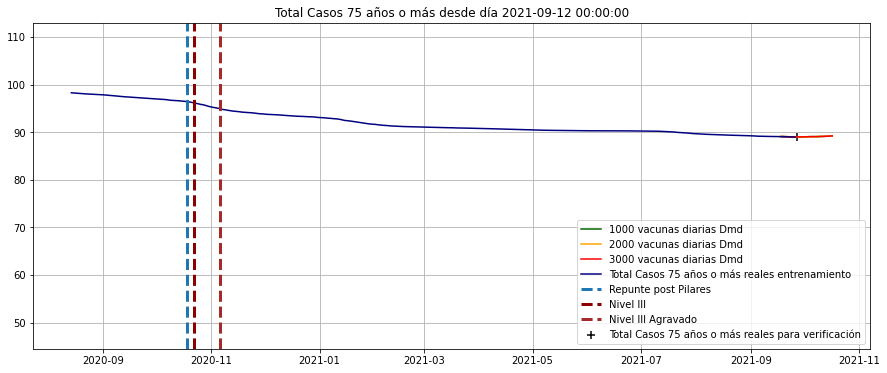

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Asintomáticos (%)
Fecha,,,
2021-03-19,-0.000683,0.000071,0.000280
2021-03-20,-0.000675,0.000036,0.002118
2021-03-21,-0.000464,0.000030,0.001050
2021-03-22,-0.001272,0.000142,-0.000588
2021-03-23,-0.001136,0.000133,-0.000754
2021-03-24,-0.000855,0.000104,-0.000624
2021-03-25,-0.000452,0.000044,0.000470
2021-03-26,-0.000974,0.000118,-0.000813
2021-03-27,-0.000471,0.000067,-0.000916


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Asintomáticos (%)
Casos,0.733844,0.014218,0.622168


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-09-27
Casos,84.0
test coresp,2484.0
Asintomáticos (%),63.0


Fecha,2021-09-28
Casos,136.156389


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,178.992452


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,314.421717
2021-04-18,249.433524
2021-04-19,132.786631
2021-04-20,204.066230


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,427.818624
2020-08-17,396.0,367.806801
2020-08-18,467.0,375.764305
2020-08-19,347.0,436.074300
2020-08-20,357.0,331.900304
...,...,...
2021-09-24,85.0,134.821113
2021-09-25,52.0,129.559007
2021-09-26,41.0,88.064160


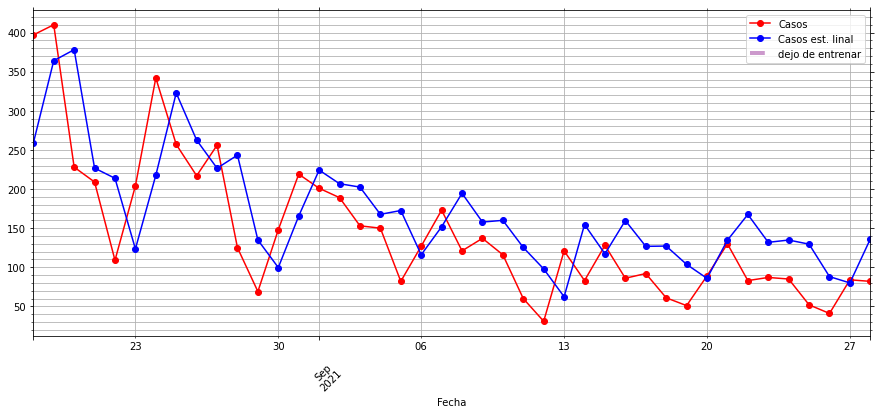

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

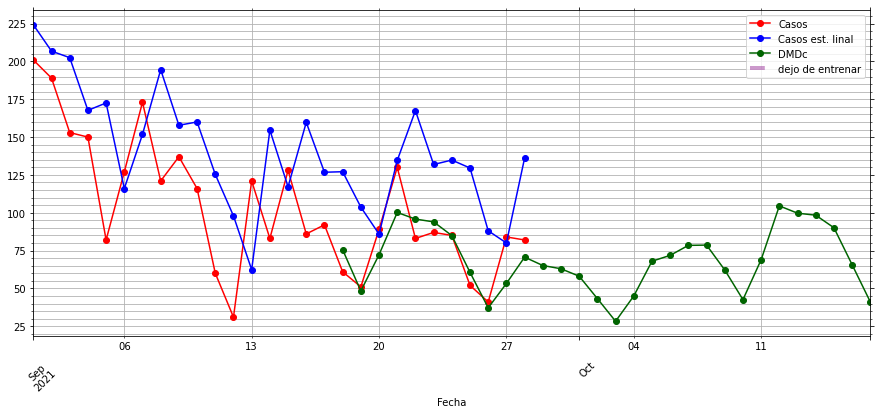

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(19.341378428281885, 118.97341497325871)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      #'Nº de pacientes a los que se ha realizado pruebas',
                      'Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

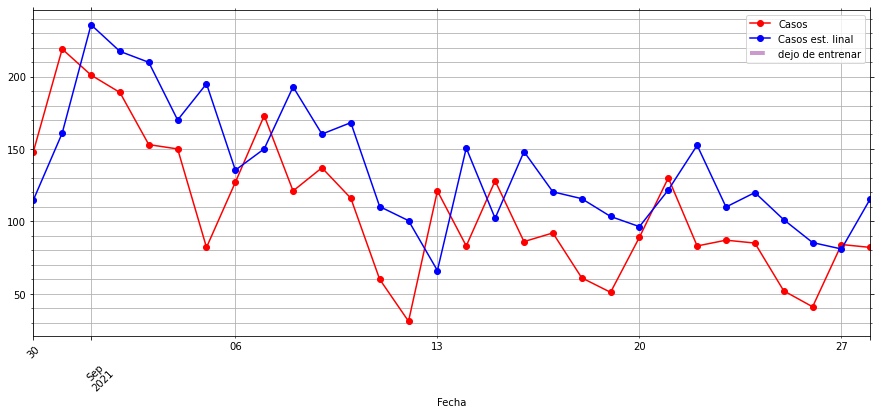

(-4.910993838496825, 114.02713860542684)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-03-14 00:00:00 24.578110801227837 122.83732876718541
2021-03-15 00:00:00 24.29275306501028 122.01687737014944
2021-03-16 00:00:00 24.28734073563946 122.01092931527299
2021-03-17 00:00:00 26.497951222624184 125.16026936874901
2021-03-18 00:00:00 21.15515765078695 119.42734645489888
2021-03-19 00:00:00 19.130699730255113 118.90443022639248
2021-03-20 00:00:00 20.847644333770603 121.7527676348009
2021-03-21 00:00:00 23.93620508688243 128.81586683797204
2021-03-22 00:00:00 23.047302360923116 127.07634166783996
2021-03-23 00:00:00 22.579129051464978 126.4350988281574
2021-03-24 00:00:00 22.854230793329293 126.83410495016466
2021-03-25 00:00:00 25.32968498844316 131.13462407289188
2021-03-26 00:00:00 26.528739017184204 134.38576287869404
2021-03-27 00:00:00 33.7691409300839 149.20475272911784
2021-03-28 00:00:00 35.85352693093865 154.03521616699194
2021-03-29 00:00:00 35.670058227269635 152.31651261103303
2021-03-30 00:00:00 33.89336938283683 146.06625252369204
2021-03-31 00:00:00 33.10

2021-08-11 00:00:00 340.3780487804878 265.20588672416693
2021-08-12 00:00:00 340.3780487804878 265.20588672416693
2021-08-13 00:00:00 340.3780487804878 265.20588672416693
2021-08-14 00:00:00 340.3780487804878 265.20588672416693
2021-08-15 00:00:00 340.3780487804878 265.20588672416693
2021-08-16 00:00:00 340.3780487804878 265.20588672416693
2021-08-17 00:00:00 340.3780487804878 265.20588672416693
2021-08-18 00:00:00 340.3780487804878 265.20588672416693
2021-08-19 00:00:00 340.3780487804878 265.20588672416693
2021-08-20 00:00:00 340.3780487804878 265.20588672416693
2021-08-21 00:00:00 340.3780487804878 265.20588672416693
2021-08-22 00:00:00 340.3780487804878 265.20588672416693
2021-08-23 00:00:00 340.3780487804878 265.20588672416693
2021-08-24 00:00:00 340.3780487804878 265.20588672416693
2021-08-25 00:00:00 340.3780487804878 265.20588672416693
2021-08-26 00:00:00 340.3780487804878 265.20588672416693
2021-08-27 00:00:00 340.3780487804878 265.20588672416693
2021-08-28 00:00:00 340.3780487

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-07-16 00:00:00 2.553021515756271 114.30870434879192
2021-07-17 00:00:00 5.365490693026852 114.0937836009039
2021-07-18 00:00:00 1.2403736535453957 114.23244812930358
2021-07-19 00:00:00 -4.513952611772583 115.3203165926745
2021-07-20 00:00:00 -2.6810697242438626 114.82078662045681
2021-07-21 00:00:00 -4.0960469779223185 115.15164244533631
2021-07-22 00:00:00 -2.755014459673557 114.8221304669541
2021-07-23 00:00:00 2.7997321874763705 114.07614311495328
2021-07-24 00:00:00 5.026348803917806 113.96503604336424
2021-07-25 00:00:00 3.9336903993088566 113.9810008738302
2021-07-26 00:00:00 -0.20090113216993624 114.21714024177425
2021-07-27 00:00:00 -0.21617742111707425 114.21972052575671
2021-07-28 00:00:00 0.8532969100784175 114.09578881635095
2021-07-29 00:00:00 0.9070785255321444 114.08976057256152
2021-07-30 00:00:00 3.2619556125870353 113.87243901127925
2021-07-31 00:00:00 5.123029538722453 113.8305530350196
2021-08-01 00:00:00 4.172557035583068 113.8134167723954
2021-08-02 00:00:00

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,2021-03-29,2021-03-30,2021-03-31,2021-04-01,2021-04-02,...,2021-09-15,2021-09-16,2021-09-17,2021-09-18,2021-09-19,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24
Casos,176.00,161.00,148.00,108.00,82.00,138.00,225.00,198.00,162.0,88.00,...,128.00,86.00,92.00,61.00,51.00,89.00,130.00,83.00,87.00,85.00
test coresp,2437.00,2037.00,2229.00,1422.00,994.00,1729.00,2286.00,2882.00,1620.0,863.00,...,2352.00,1895.00,2004.00,1477.00,913.00,2203.00,2577.00,2454.00,2279.00,2581.00
Tasa de positividad (%),7.22,7.90,6.64,7.59,8.25,7.98,9.84,6.87,10.0,10.20,...,5.44,4.54,4.59,4.13,5.59,4.04,5.04,3.38,3.82,3.29
Asintomáticos (%),40.00,43.00,35.00,17.00,34.00,41.00,46.00,44.00,44.0,42.00,...,52.00,59.00,50.00,61.00,57.00,61.00,57.00,58.00,62.00,49.00
Casos$^{{-\Delta t}}$,149.00,176.00,161.00,148.00,108.00,82.00,138.00,225.00,198.0,162.00,...,83.00,128.00,86.00,92.00,61.00,51.00,89.00,130.00,83.00,87.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Asintomáticos (%)$^{-26\cdot \Delta t}$,43.00,44.00,41.00,41.00,46.00,50.00,40.00,45.00,53.0,35.00,...,44.00,49.00,50.00,61.00,54.00,63.00,56.00,34.00,38.00,58.00
Casos$^{-27\cdot \Delta t}$,203.00,187.00,130.00,64.00,141.00,224.00,172.00,168.00,140.0,100.00,...,410.00,228.00,209.00,109.00,204.00,342.00,257.00,217.00,256.00,125.00
test coresp$^{-27\cdot \Delta t}$,2338.00,2400.00,1692.00,1087.00,2017.00,2806.00,2189.00,1990.00,1919.0,1357.00,...,2897.00,2256.00,2104.00,871.00,2108.00,2687.00,2444.00,2289.00,2414.00,1372.00
Tasa de positividad (%)$^{-27\cdot \Delta t}$,8.68,7.79,7.68,5.89,6.99,7.98,7.86,8.44,7.3,7.37,...,14.15,10.11,9.93,12.51,9.68,12.73,10.52,9.48,10.60,9.11


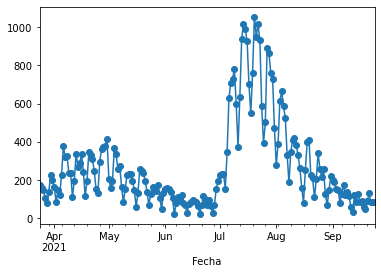

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', 'Tasa de positividad (%)',
                   #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 28
entrenoDesde = '2021-03-24'
entrenoHasta = '2021-09-24'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-03-24,-0.000655,0.000079,0.017859,-0.000514,0.000318,-0.000054,-0.019787,-0.000761,-0.000479,0.000057,...,0.016384,-0.000757,0.000213,0.000005,-0.006447,0.002405,-0.000374,0.000038,0.019605,-0.000760
2021-03-25,0.000078,0.000012,-0.001763,0.000003,-0.000576,0.000061,0.011540,-0.000682,-0.000013,-0.000016,...,-0.004177,-0.000615,-0.000438,0.000069,0.013793,-0.000227,-0.000137,0.000040,0.006683,0.002040
2021-03-26,0.000553,-0.000039,-0.019735,-0.001982,-0.000585,0.000075,0.017155,-0.000368,-0.000288,0.000029,...,-0.000918,0.000966,0.000034,0.000041,0.003254,-0.000864,-0.000266,0.000042,0.004987,0.000874
2021-03-27,0.000019,0.000016,0.001254,-0.002979,0.000191,-0.000010,-0.012056,-0.001141,-0.000161,0.000045,...,0.003094,0.001736,-0.000385,0.000069,-0.000493,0.000293,0.000023,0.000027,0.002178,-0.000447
2021-03-28,-0.000170,-0.000004,-0.000020,-0.000590,0.000079,0.000022,0.001241,-0.003331,0.000100,-0.000005,...,-0.006507,0.001490,-0.000014,0.000034,0.004142,0.001884,-0.000237,0.000062,-0.001582,0.000357
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-20,-0.000067,0.000014,-0.003037,-0.000180,-0.000475,0.000047,0.021068,-0.000242,0.000323,-0.000017,...,0.002395,0.000454,-0.000579,0.000042,0.012340,0.001806,0.000377,-0.000048,0.000523,0.000756
2021-09-21,-0.000315,0.000062,-0.002546,0.000669,-0.000028,0.000017,-0.000002,-0.000544,-0.000415,0.000026,...,0.006592,-0.002009,-0.000013,0.000052,0.006760,0.000002,-0.000110,-0.000013,0.000036,0.003313
2021-09-22,-0.000129,0.000052,-0.015012,0.000532,-0.000594,0.000099,0.015390,-0.000014,0.000271,-0.000038,...,-0.016242,-0.001478,-0.000119,0.000032,0.013834,-0.002475,0.000162,-0.000006,-0.006998,0.002258


In [94]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Casos,0.761496,-0.022199,0.786792,-1.096905,-0.342748,0.009334,8.666355,0.390712,0.347548,0.00084,...,3.197206,0.758317,0.268832,-0.049051,-9.187319,1.203107,-0.412451,0.053664,14.5271,-0.507217


In [95]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,8.31,48.0,334.0,3634.0,9.19,48.0,370.0,4377.0,...,9.27,50.0,235.0,2216.0,10.6,56.0,239.0,2734.0,8.74,49.0


,Casos est. lineal
Fecha,
2021-05-07,197.044786


In [96]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-03-29    138.0
2021-03-30    225.0
2021-03-31    198.0
2021-04-01    162.0
2021-04-02     88.0
              ...  
2021-09-24     85.0
2021-09-25     52.0
2021-09-26     41.0
2021-09-27     84.0
2021-09-28     82.0
Name: Casos, Length: 184, dtype: float64

In [97]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-03-29,198.864121
2021-03-30,255.709395
2021-03-31,223.237782
2021-04-01,211.157702
2021-04-02,149.215692
...,...
2021-09-24,64.176038
2021-09-25,68.400024
2021-09-26,38.146010


In [98]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-09-28'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-03-29,138.0,198.864121
2021-03-30,225.0,255.709395
2021-03-31,198.0,223.237782
2021-04-01,162.0,211.157702
2021-04-02,88.0,149.215692
...,...,...
2021-09-24,85.0,64.176038
2021-09-25,52.0,68.400024
2021-09-26,41.0,38.146010


In [99]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-03-29 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-09-22,83.0,92.879840,95.802049
2021-09-23,87.0,51.587836,93.969130
2021-09-24,85.0,64.176038,84.903249
2021-09-25,52.0,68.400024,60.590337
2021-09-26,41.0,38.146010,37.139745
2021-09-27,84.0,75.929325,53.256129
2021-09-28,82.0,77.221915,70.648831
2021-09-29,NaN,NaN,65.126063
2021-09-30,NaN,NaN,62.966874
2021-10-01,NaN,NaN,58.045402


(-0.1030798170584343, 31.83878011003769)

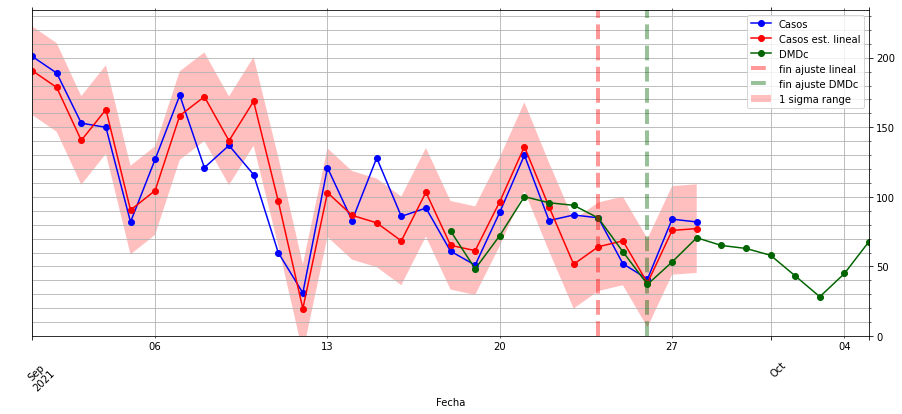

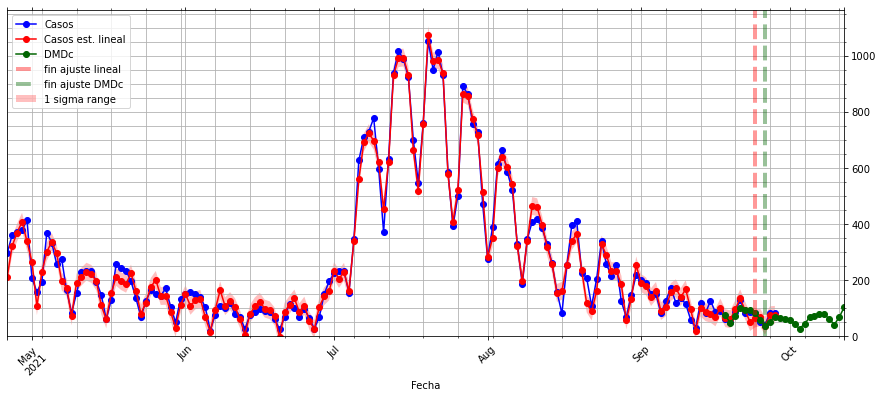

In [100]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

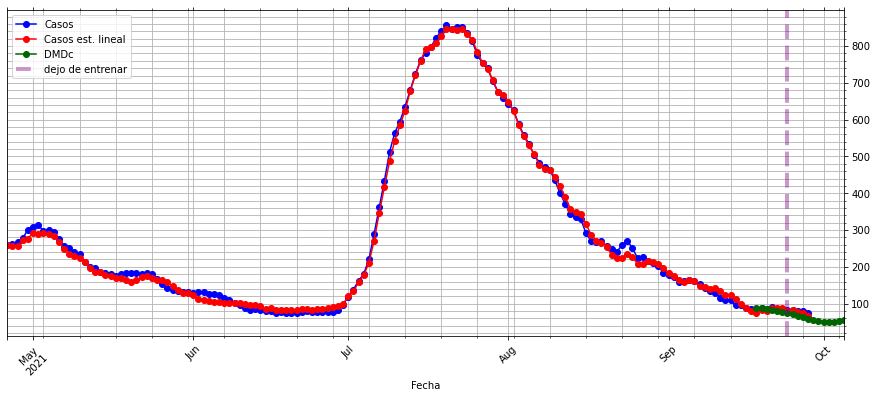

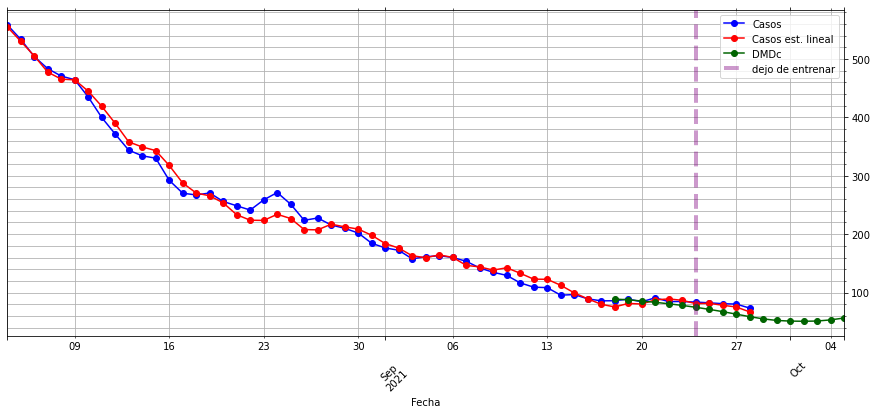

In [101]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [102]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(-0.1030798170584343, 31.83878011003769)

In [103]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

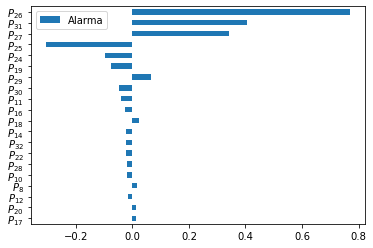

In [104]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

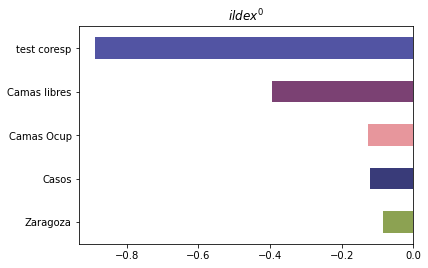

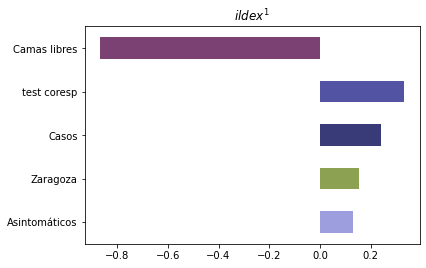

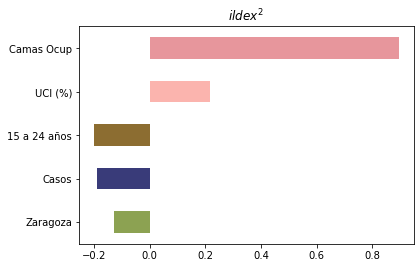

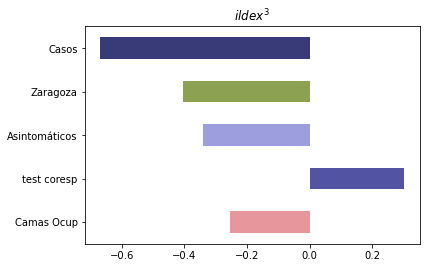

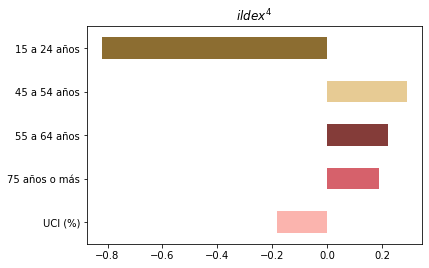

...

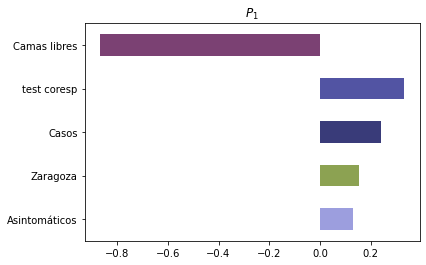

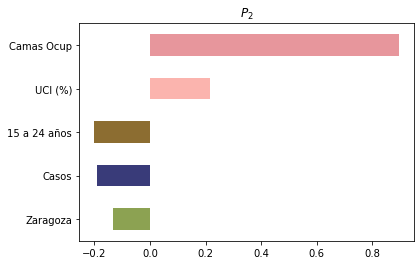

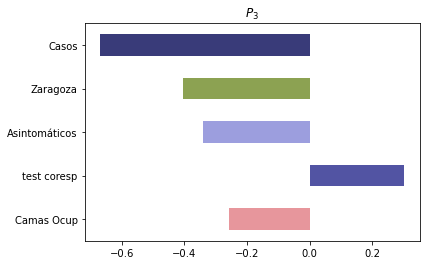

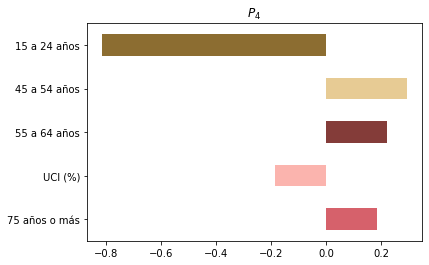

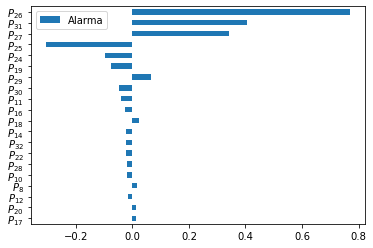

KeyError: 'Total Casos 75 años o más'

In [105]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes